In [1]:
from os import path, listdir
import argparse
import numpy as np
import json
import tensorflow as tf

ModuleNotFoundError: No module named 'tensorflow'

In [2]:
!pip install tensorflow

  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4835 sha256=01d8cdf23708c37b8c24c8695cc599269d76f788575aa95afaf12c36c0f55cd2
  Stored in directory: c:\users\rielst.amand\appdata\local\pip\cache\wheels\a0\16\9c\5473df82468f958445479c59e784896fa24f4a5fc024b0f501
Successfully built termcolor


In [3]:
!conda install tensorflow

^C


In [1]:
import tensorflow as tf

In [91]:
from os import path, listdir, mkdir
from pathlib import Path
from io import StringIO
from re import match
import pandas as pd
import argparse
import json

In [9]:
results_df = pd.read_excel("091920-COV3-B.xlsx", sheet_name="Results", skiprows=2)

In [10]:
results_df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76
0,ROW,NaN,NaN,NaN,NaN,20091827973,NaN,NaN,20091933703,NaN,...,NaN,20091831400,NaN,NaN,20091830004,NaN,NaN,20091832692,NaN,NaN
1,A,MS2,REPEAT,INCONCLUSIVE,NaN,NaN,NaN,0.0,NaN,NaN,...,0,MS2,NaN,0.0,MS2,NaN,0.0,MS2,NaN,0.0
2,NaN,N gene,REPEAT,INCONCLUSIVE,NaN,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0
3,NaN,ORF1ab,REPEAT,INCONCLUSIVE,NaN,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0
4,NaN,RP-Cy5,REPEAT,INCONCLUSIVE,INVALID,RP-Cy5,NaN,0.0,RP-Cy5,NaN,...,0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,NaN,N gene,REPEAT,INCONCLUSIVE,NaN,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,N gene,1.0,0.0
108,NaN,ORF1ab,REPEAT,INCONCLUSIVE,NaN,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,ORF1ab,1.0,0.0
109,NaN,RP-Cy5,REPEAT,INCONCLUSIVE,NaN,RP-Cy5,NaN,0.0,RP-Cy5,NaN,...,0,REPEAT,NaN,0.0,REPEAT,NaN,0.0,RP-Cy5,NaN,0.0
110,NaN,S gene,REPEAT,INCONCLUSIVE,NaN,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,S gene,1.0,0.0


In [13]:
results_df.columns

Index(['Unnamed: 0', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4',
       'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9',
       'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13',
       'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17',
       'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20', 'Unnamed: 21',
       'Unnamed: 22', 'Unnamed: 23', 'Unnamed: 24', 'Unnamed: 25',
       'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28', 'YAH', 'Unnamed: 30',
       'Unnamed: 31', 'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34',
       'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38',
       'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42',
       'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46',
       'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50',
       'Unnamed: 51', 'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54',
       'Unnamed: 55', 'Unnamed: 56', 'Unnamed: 57', 'Unnamed: 58',
       'Unnamed: 59', 'Unnamed: 60'

In [16]:
results_df = results_df.drop(["Unnamed: 2", "Unnamed: 3", "Unnamed: 4"], axis=1)
results_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,...,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76
0,ROW,NaN,20091827973,NaN,NaN,20091933703,NaN,NaN,20091825872,NaN,...,NaN,20091831400,NaN,NaN,20091830004,NaN,NaN,20091832692,NaN,NaN
1,A,MS2,NaN,NaN,0.0,NaN,NaN,0.0,MS2,NaN,...,0,MS2,NaN,0.0,MS2,NaN,0.0,MS2,NaN,0.0
2,NaN,N gene,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0
3,NaN,ORF1ab,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0
4,NaN,RP-Cy5,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,...,0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,NaN,N gene,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,N gene,1.0,0.0
108,NaN,ORF1ab,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,ORF1ab,1.0,0.0
109,NaN,RP-Cy5,RP-Cy5,NaN,0.0,RP-Cy5,NaN,0.0,RP-Cy5,NaN,...,0,REPEAT,NaN,0.0,REPEAT,NaN,0.0,RP-Cy5,NaN,0.0
110,NaN,S gene,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,...,0,NaN,0.0,0.0,NaN,0.0,0.0,S gene,1.0,0.0


In [17]:
i = range(0, 100)
i

range(0, 100)

In [18]:
print(i)

range(0, 100)


In [27]:
range1 = range(5, 77)
for i in range1:
    if ((i + 4) % 3 == 0):
        print(i)

5
8
11
14
17
20
23
26
29
32
35
38
41
44
47
50
53
56
59
62
65
68
71
74


In [24]:
3%3

0

In [28]:
desired_columns = [i for i in range1 if ((i + 4) % 3 == 0)]
desired_columns

[5,
 8,
 11,
 14,
 17,
 20,
 23,
 26,
 29,
 32,
 35,
 38,
 41,
 44,
 47,
 50,
 53,
 56,
 59,
 62,
 65,
 68,
 71,
 74]

In [29]:
undesired_columns = [i for i in range1 if ((i + 4) % 3 != 0)]
undesired_columns

[6,
 7,
 9,
 10,
 12,
 13,
 15,
 16,
 18,
 19,
 21,
 22,
 24,
 25,
 27,
 28,
 30,
 31,
 33,
 34,
 36,
 37,
 39,
 40,
 42,
 43,
 45,
 46,
 48,
 49,
 51,
 52,
 54,
 55,
 57,
 58,
 60,
 61,
 63,
 64,
 66,
 67,
 69,
 70,
 72,
 73,
 75,
 76]

In [30]:
for i in undesired_columns:
    results_df = results_df.drop([f"Unnamed: {i}"], axis=1)
results_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,ROW,NaN,20091827973,20091933703,20091825872,20091933884,20091830503,20091830741,20091827148,20091933857,...,20091610264,20091831305,20091608648,20091933810,20091716149,20091828146,20091716133,20091831400,20091830004,20091832692
1,A,MS2,NaN,NaN,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,NaN,MS2,MS2,MS2,MS2,MS2
2,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN
3,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN
4,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
108,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
109,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
110,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene


In [31]:
results_df.head(10)

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,ROW,NaN,20091827973,20091933703,20091825872,20091933884,20091830503,20091830741,20091827148,20091933857,...,20091610264,20091831305,20091608648,20091933810,20091716149,20091828146,20091716133,20091831400,20091830004,20091832692
1,A,MS2,NaN,NaN,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,NaN,MS2,MS2,MS2,MS2,MS2
2,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN
3,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN
4,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5
5,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN
6,SOURCE WELL,NaN,091920-09 A1,091920-11 A1,091920-09 A2,091920-11 A2,091920-09 A3,091920-11 A3,091920-09 A4,091920-11 A4,...,091920-09 A8,091920-11 A8,091920-09 A9,091920-11 A9,091920-09 A10,091920-11 A10,091920-09 A11,091920-11 A11,091920-09 A12,091920-11 A12
7,ROW,NaN,20091831002,20091593725,20091831019,20091486893,20091831031,20091830868,20091831502,20091607110,...,20091830396,20091486971,20091830385,20091487624,20091831012,20091825258,20091831017,20091608448,20091831537,20091722641
8,B,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2
9,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
results_df.loc[7]

Unnamed: 0             ROW
Unnamed: 1             NaN
Unnamed: 5     20091831002
Unnamed: 8     20091593725
Unnamed: 11    20091831019
Unnamed: 14    20091486893
Unnamed: 17    20091831031
Unnamed: 20    20091830868
Unnamed: 23    20091831502
Unnamed: 26    20091607110
YAH            20091831029
Unnamed: 32    20091611687
Unnamed: 35    20091831022
Unnamed: 38    20091608292
Unnamed: 41    20091830403
Unnamed: 44    20091609519
Unnamed: 47    20091830396
Unnamed: 50    20091486971
Unnamed: 53    20091830385
Unnamed: 56    20091487624
Unnamed: 59    20091831012
Unnamed: 62    20091825258
Unnamed: 65    20091831017
Unnamed: 68    20091608448
Unnamed: 71    20091831537
Unnamed: 74    20091722641
Name: 7, dtype: object

In [33]:
plate_rows = [i for i in range(0, 112) if (i % 7 == 0)]
plate_rows

[0, 7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77, 84, 91, 98, 105]

In [35]:
plate_row_labels = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P"]

In [37]:
results_df.loc[0:6]

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,ROW,NaN,20091827973,20091933703,20091825872,20091933884,20091830503,20091830741,20091827148,20091933857,...,20091610264,20091831305,20091608648,20091933810,20091716149,20091828146,20091716133,20091831400,20091830004,20091832692
1,A,MS2,NaN,NaN,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,NaN,MS2,MS2,MS2,MS2,MS2
2,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN
3,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN
4,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5
5,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN
6,SOURCE WELL,NaN,091920-09 A1,091920-11 A1,091920-09 A2,091920-11 A2,091920-09 A3,091920-11 A3,091920-09 A4,091920-11 A4,...,091920-09 A8,091920-11 A8,091920-09 A9,091920-11 A9,091920-09 A10,091920-11 A10,091920-09 A11,091920-11 A11,091920-09 A12,091920-11 A12


In [40]:
row_a_df = results_df.loc[0:6]
row_a_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,ROW,NaN,20091827973,20091933703,20091825872,20091933884,20091830503,20091830741,20091827148,20091933857,...,20091610264,20091831305,20091608648,20091933810,20091716149,20091828146,20091716133,20091831400,20091830004,20091832692
1,A,MS2,NaN,NaN,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,NaN,MS2,MS2,MS2,MS2,MS2
2,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN
3,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN
4,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5
5,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN
6,SOURCE WELL,NaN,091920-09 A1,091920-11 A1,091920-09 A2,091920-11 A2,091920-09 A3,091920-11 A3,091920-09 A4,091920-11 A4,...,091920-09 A8,091920-11 A8,091920-09 A9,091920-11 A9,091920-09 A10,091920-11 A10,091920-09 A11,091920-11 A11,091920-09 A12,091920-11 A12


In [41]:
row_b_df = results_df.loc[7:13]
row_b_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
7,ROW,NaN,20091831002,20091593725,20091831019,20091486893,20091831031,20091830868,20091831502,20091607110,...,20091830396,20091486971,20091830385,20091487624,20091831012,20091825258,20091831017,20091608448,20091831537,20091722641
8,B,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2
9,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5
12,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,SOURCE WELL,NaN,091920-10 A1,091920-12 A1,091920-10 A2,091920-12 A2,091920-10 A3,091920-12 A3,091920-10 A4,091920-12 A4,...,091920-10 A8,091920-12 A8,091920-10 A9,091920-12 A9,091920-10 A10,091920-12 A10,091920-10 A11,091920-12 A11,091920-10 A12,091920-12 A12


In [42]:
row_c_df = results_df.loc[14:20]
row_d_df = results_df.loc[21:27]
row_e_df = results_df.loc[28:34]
row_f_df = results_df.loc[35:41]
row_g_df = results_df.loc[42:48]
row_h_df = results_df.loc[49:55]
row_i_df = results_df.loc[56:62]
row_j_df = results_df.loc[63:69]
row_k_df = results_df.loc[70:76]
row_l_df = results_df.loc[77:83]
row_m_df = results_df.loc[84:90]
row_n_df = results_df.loc[91:97]
row_o_df = results_df.loc[98:104]
row_p_df = results_df.loc[105:111]

In [43]:
row_p_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
105,ROW,NaN,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
106,P,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
107,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
108,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
109,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
110,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
111,SOURCE WELL,NaN,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [92]:
import numpy as np

In [45]:
results_np = results_df.to_numpy()

In [46]:
results_np

array([['ROW', nan, 20091827973, ..., 20091831400, 20091830004,
        20091832692],
       ['A', 'MS2', nan, ..., 'MS2', 'MS2', 'MS2'],
       [nan, 'N gene', nan, ..., nan, nan, nan],
       ...,
       [nan, 'RP-Cy5', 'RP-Cy5', ..., 'REPEAT', 'REPEAT', 'RP-Cy5'],
       [nan, 'S gene', nan, ..., nan, nan, 'S gene'],
       ['SOURCE WELL', nan, '091920-10 H1', ..., '091920-09 H12',
        '091920-09 H12', '091920-12 H12']], dtype=object)

In [47]:
np_array_list = np.split(results_np, 16)

In [48]:
np_array_list

[array([['ROW', nan, 20091827973, 20091933703, 20091825872, 20091933884,
         20091830503, 20091830741, 20091827148, 20091933857, 20091719627,
         20091825656, 20091825447, 20091933873, 20091610294, 20091825304,
         20091610264, 20091831305, 20091608648, 20091933810, 20091716149,
         20091828146, 20091716133, 20091831400, 20091830004, 20091832692],
        ['A', 'MS2', nan, nan, 'MS2', 'MS2', 'MS2', 'MS2', 'MS2', 'MS2',
         nan, 'MS2', 'MS2', 'MS2', 'MS2', 'MS2', 'MS2', 'MS2', 'MS2',
         'MS2', nan, 'MS2', 'MS2', 'MS2', 'MS2', 'MS2'],
        [nan, 'N gene', nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
         nan, nan, nan, nan, nan, nan, nan, nan, 'N gene', nan, nan, nan,
         nan, nan],
        [nan, 'ORF1ab', nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
         nan, nan, nan, nan, nan, nan, nan, nan, 'ORF1ab', nan, nan, nan,
         nan, nan],
        [nan, 'RP-Cy5', 'RP-Cy5', 'RP-Cy5', 'RP-Cy5', 'RP-Cy5', 'RP-Cy5',
         'RP-Cy5', '

In [51]:
row_p_df.iloc[0][0]

'ROW'

In [54]:
df_list = [row_a_df, row_b_df, row_c_df, row_d_df, row_e_df, row_f_df, row_g_df, row_h_df, row_i_df, row_j_df, row_k_df,
           row_l_df, row_m_df, row_n_df, row_o_df, row_p_df]

In [55]:
def insert_row(row_number, df, row_value): 
    # Starting value of upper half 
    start_upper = 0
   
    # End value of upper half 
    end_upper = row_number 
   
    # Start value of lower half 
    start_lower = row_number 
   
    # End value of lower half 
    end_lower = df.shape[0] 
   
    # Create a list of upper_half index 
    upper_half = [*range(start_upper, end_upper, 1)] 
   
    # Create a list of lower_half index 
    lower_half = [*range(start_lower, end_lower, 1)] 
   
    # Increment the value of lower half by 1 
    lower_half = [x.__add__(1) for x in lower_half] 
   
    # Combine the two lists 
    index_ = upper_half + lower_half 
   
    # Update the index of the dataframe 
    df.index = index_ 
   
    # Insert a row at the end 
    df.loc[row_number] = row_value 
    
    # Sort the index labels 
    df = df.sort_index() 
   
    # return the dataframe 
    return df 

In [57]:
row_p_df.iloc[0][1]

nan

In [58]:
row_p_df = row_p_df
row_p_df

,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
105,ROW,NaN,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
106,P,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
107,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
108,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
109,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
110,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
111,SOURCE WELL,NaN,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [66]:
new_row = [i for i in range(0, 26)]
for i in range(0, 26):
    new_row[i] = "P"
row_p_new_df = insert_row(1, row_p_df, new_row)
row_p_new_df

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,Unnamed: 0,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,ROW,NaN,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
1,P,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
2,P,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
3,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
4,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
5,NaN,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
6,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
7,SOURCE WELL,NaN,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [68]:
row_p_new_df = row_p_new_df.drop(["Unnamed: 0"], axis=1)
row_p_new_df.iloc[0][0] = "Label"
row_p_new_df.iloc[7][0] = "SOURCE WELL"
row_p_new_df.iloc[1][0] = "ROW"
row_p_new_df

,Unnamed: 1,Unnamed: 5,Unnamed: 8,Unnamed: 11,Unnamed: 14,Unnamed: 17,Unnamed: 20,Unnamed: 23,Unnamed: 26,YAH,...,Unnamed: 47,Unnamed: 50,Unnamed: 53,Unnamed: 56,Unnamed: 59,Unnamed: 62,Unnamed: 65,Unnamed: 68,Unnamed: 71,Unnamed: 74
0,Label,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,20091719139,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
1,ROW,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
3,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N gene,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
4,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
6,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,S gene,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
7,SOURCE WELL,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,091920-10 H5,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [69]:
headers = row_p_new_df.iloc[0]
row_p_new_df = row_p_new_df[1:]
row_p_new_df.rename(columns = headers, inplace=True)
row_p_new_df

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\frame.py:4304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Label,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,20091719139,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
1,ROW,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
3,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N gene,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
4,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
6,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,S gene,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
7,SOURCE WELL,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,091920-10 H5,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [73]:
rows = row_p_new_df.loc[:7, "Label"]
row_p_new_df.rename(rows, inplace=True)
row_p_new_df

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\frame.py:4304: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Label,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,20091719139,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
ROW,ROW,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
N gene,N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N gene,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
ORF1ab,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
S gene,S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,S gene,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
SOURCE WELL,SOURCE WELL,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,091920-10 H5,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [74]:
row_p_new_df.drop(["Label"], axis=1, inplace=True)
row_p_new_df

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\frame.py:4170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,20091833471,20091830728,20091719514,20091610232,20070824562,20091714681,20091833369,20091489572,20091719139,20091598733,...,20091721652,20091933803,20091721246,20091827021,20091827356,20091831230,NaN,neg,neg,PC
ROW,P,P,P,P,P,P,P,P,P,P,...,P,P,P,P,P,P,P,P,P,P
MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,...,MS2,MS2,MS2,MS2,MS2,MS2,MS2,NaN,MS2,NaN
N gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N gene,NaN,...,NaN,NaN,N gene,NaN,NaN,NaN,NaN,NaN,NaN,N gene
ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab,NaN,...,NaN,NaN,ORF1ab,NaN,NaN,NaN,NaN,NaN,NaN,ORF1ab
RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,...,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,RP-Cy5,REPEAT,REPEAT,RP-Cy5
S gene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REPEAT,S gene,NaN,...,NaN,NaN,S gene,NaN,NaN,NaN,NaN,NaN,NaN,S gene
SOURCE WELL,091920-10 H1,091920-12 H1,091920-10 H2,091920-12 H2,091920-10 H3,091920-12 H3,091920-10 H4,091920-12 H4,091920-10 H5,091920-12 H5,...,091920-10 H8,091920-12 H8,091920-10 H9,091920-12 H9,091920-10 H10,091920-12 H10,091920-09 H11,091920-09 H12,091920-09 H12,091920-12 H12


In [90]:
row_p_transpose = row_p_new_df.transpose()
row_p_transpose.index.name = "Sample ID"
row_p_transpose.reset_index(inplace=True)
row_p_transpose

,Sample ID,ROW,MS2,N gene,ORF1ab,RP-Cy5,S gene,SOURCE WELL
0,20091833471,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-10 H1
1,20091830728,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-12 H1
2,20091719514,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-10 H2
3,20091610232,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-12 H2
4,20070824562,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-10 H3
5,20091714681,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-12 H3
6,20091833369,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-10 H4
7,20091489572,P,MS2,NaN,NaN,RP-Cy5,REPEAT,091920-12 H4
8,20091719139,P,NaN,N gene,ORF1ab,RP-Cy5,S gene,091920-10 H5
9,20091598733,P,MS2,NaN,NaN,RP-Cy5,NaN,091920-12 H5


In [96]:
row_p_transpose.fillna({"MS2": 0, "N gene": 0, "ORF1ab": 0, "RP-Cy5": 0, "S gene": 0}, inplace=True)
row_p_transpose.replace({"MS2": 1, "N gene": 1, "ORF1ab": 1, "RP-Cy5": 1, "S gene": 1}, inplace=True)
row_p_transpose

,Sample ID,ROW,MS2,N gene,ORF1ab,RP-Cy5,S gene,SOURCE WELL
0,20091833471,P,1,0,0,1,0,091920-10 H1
1,20091830728,P,1,0,0,1,0,091920-12 H1
2,20091719514,P,1,0,0,1,0,091920-10 H2
3,20091610232,P,1,0,0,1,0,091920-12 H2
4,20070824562,P,1,0,0,1,0,091920-10 H3
5,20091714681,P,1,0,0,1,0,091920-12 H3
6,20091833369,P,1,0,0,1,0,091920-10 H4
7,20091489572,P,1,0,0,1,REPEAT,091920-12 H4
8,20091719139,P,0,1,1,1,1,091920-10 H5
9,20091598733,P,1,0,0,1,0,091920-12 H5


In [98]:
for i in range(0, 16):
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


In [8]:
def drop_hidden_columns(initial_df):
    """
    Drops the hidden and empty columns from a Quant Excel Results tab DataFrame.
    """
    results_df = initial_df.drop(["Unnamed: 2", "Unnamed: 3", "Unnamed: 4"], axis=1)
    undesired_columns = [i for i in range(5, 77) if ((i + 4) % 3 != 0)]
    for i in undesired_columns:
        results_df.drop([f"Unnamed: {i}"], axis=1, inplace=True)
    return results_df

def split_plate_into_rows(results_df):
    """
    Splits a given DataFrame from a Quant Excel Results tab into 16 equivalent DataFrames, one for each plate row.
    """
    row_a_df = results_df.loc[0:6]
    row_b_df = results_df.loc[7:13]
    row_c_df = results_df.loc[14:20]
    row_d_df = results_df.loc[21:27]
    row_e_df = results_df.loc[28:34]
    row_f_df = results_df.loc[35:41]
    row_g_df = results_df.loc[42:48]
    row_h_df = results_df.loc[49:55]
    row_i_df = results_df.loc[56:62]
    row_j_df = results_df.loc[63:69]
    row_k_df = results_df.loc[70:76]
    row_l_df = results_df.loc[77:83]
    row_m_df = results_df.loc[84:90]
    row_n_df = results_df.loc[91:97]
    row_o_df = results_df.loc[98:104]
    row_p_df = results_df.loc[105:111]
    return [row_a_df, row_b_df, row_c_df, row_d_df, row_e_df, row_f_df, row_g_df, row_h_df, 
            row_i_df, row_j_df, row_k_df, row_l_df, row_m_df, row_n_df, row_o_df, row_p_df]


def insert_row(row_number, df, row_value):
    """
    Inserts a row into any given index of a DataFrame when provided: 
        the desired insertion index (i.e. what index the new row will have in the DataFrame), 
        the DataFrame upon which to act, 
        the values for the new row.
    """
    
    # Starting value of upper half 
    start_upper = 0
   
    # End value of upper half 
    end_upper = row_number 
   
    # Start value of lower half 
    start_lower = row_number 
   
    # End value of lower half 
    end_lower = df.shape[0] 
   
    # Create a list of upper_half index 
    upper_half = [*range(start_upper, end_upper, 1)] 
   
    # Create a list of lower_half index 
    lower_half = [*range(start_lower, end_lower, 1)] 
   
    # Increment the value of lower half by 1 
    lower_half = [x.__add__(1) for x in lower_half] 
   
    # Combine the two lists 
    index_ = upper_half + lower_half 
   
    # Update the index of the dataframe 
    df.index = index_ 
   
    # Insert a row at the end 
    df.loc[row_number] = row_value 
    
    # Sort the index labels 
    df = df.sort_index() 
   
    # return the dataframe 
    return df 


def new_letter_row(plate_row_letter):
    """
    Creates a row of a single letter 26 columns in length when provided the letter itself.
    """
    new_row = [i for i in range(0, 26)]
    for i in range(0, 26):
        new_row[i] = plate_row_letter
    return new_row

def transform_plate_row(row_df, plate_row_letter):
    new_row = new_letter_row(plate_row_letter)
    row_df = insert_row(1, row_df, new_row)
    row_df.drop(["Unnamed: 0"], axis=1, inplace=True)
    row_df.iloc[0][0] = "Labels"
    row_df.iloc[1][0] = "ROW"
    row_df.iloc[7][0] = "SOURCE WELL"
    headers = row_df.iloc[0]
    row_df = row_df[1:]
    row_df.rename(columns = headers, inplace=True)
    new_row_labels = row_df.loc[:7, "Labels"]
    row_df.rename(new_row_labels, inplace=True)
    row_df.drop(["Labels"], axis=1, inplace=True)
    row_df = row_df.transpose()
    row_df.index.name = "Sample ID"
    row_df.reset_index(inplace=True)
    return row_df

def create_binary_results(row_df):
    """
    Replaces all instances of NaN for a given plate row DataFrame in the gene columns with 0, and all instances of the gene names themselves with 1. REPEAT is left untouched.
    """
    row_df_filled = row_df.fillna({"MS2": "NON-AMPLIFIED", 
                                   "N gene": "NON-AMPLIFIED", 
                                   "ORF1ab": "NON-AMPLIFIED", 
                                   "RP-Cy5": "NON-AMPLIFIED", 
                                   "S gene": "NON-AMPLIFIED"})
    row_df_binary = row_df_filled.replace({"MS2": "AMPLIFIED", 
                                           "N gene": "AMPLIFIED", 
                                           "ORF1ab": "AMPLIFIED", 
                                           "RP-Cy5": "AMPLIFIED", 
                                           "S gene": "AMPLIFIED"})
    return row_df_binary

def add_well_number(joined_df):
    """
    Adds the Well Number column to a rejoined and transformed Results tab DataFrame.
    """
    well_number_df = joined_df.reset_index(drop=True)
    well_number_df.index.name = "well"
    well_number_df.reset_index(inplace=True)
    well_number_df["well"] = [i for i in range(1, 385)]
    return well_number_df

def transform_results(excel_file):
    """
    Takes an auto-generated Quant 12K Excel file and transforms the Results sheet from an imitation plate grid to an easy-to-read table. 
    It returns that table as a pandas DataFrame. This function also adds the Well Number for each sample as a new column. 
    """
    initial_df = pd.read_excel(excel_file, sheet_name="Results", skiprows=2)
    results_df = drop_hidden_columns(initial_df)
    initial_row_df_list = split_plate_into_rows(results_df)
    plate_row_labels = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N", "O", "P"]
    inter_row_df_list = []
    for i in range(0, 16): 
        transformed_df = transform_plate_row(initial_row_df_list[i], plate_row_labels[i])
        binary_df = create_binary_results(transformed_df)
        inter_row_df_list.append(binary_df)
    joined_df = pd.concat(inter_row_df_list)
    final_df = add_well_number(joined_df).rename(columns={"Sample ID": "sample_id",
                                                          "ROW": "row",
                                                          "SOURCE WELL": "source_well", 
                                                          "N gene": "n_gene_result", 
                                                          "S gene": "s_gene_result", 
                                                          "MS2": "ms2_result", 
                                                          "ORF1ab": "orf1ab_result", 
                                                          "RP-Cy5": "rp_cy5_result"})
    
    #final_df.at[356, 'sample_id'] = 'neg0'
    #final_df.at[357, 'sample_id'] = 'neg1'
    #final_df.at[358, 'sample_id'] = 'neg2'
    #final_df.at[359, 'sample_id'] = 'neg3'
    #final_df.at[380, 'sample_id'] = 'neg4'
    #final_df.at[381, 'sample_id'] = 'neg5'
    #final_df.at[382, 'sample_id'] = 'neg6'
    
    return final_df

In [259]:
test_df = transform_results("090120-COV3-B.xlsx")
test_df

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,well,sample_id,row,ms2_result,n_gene_result,orf1ab_result,rp_cy5_result,s_gene_result,source_well
0,1,20083171334,A,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-06 A1
1,2,20082860536,A,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-11 A1
2,3,20083066768,A,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-06 A2
3,4,20082860724,A,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-11 A2
4,5,20082861663,A,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-06 A3
...,...,...,...,...,...,...,...,...,...
379,380,20090100904,P,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,090120-12 H10
380,381,neg4,P,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,REPEAT,NON-AMPLIFIED,090120-06 H11
381,382,neg5,P,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,REPEAT,NON-AMPLIFIED,090120-06 H11
382,383,neg6,P,REPEAT,NON-AMPLIFIED,NON-AMPLIFIED,REPEAT,NON-AMPLIFIED,090120-06 H11


In [194]:
list_one = [i for i in range(356, 360)]
list_two = [i for i in range(380, 383)]
list_three = list_one + list_two
list_three

[356, 357, 358, 359, 380, 381, 382]

In [154]:
import time
start = time.perf_counter()
test2_df = transform_results("091920-COV3-B.xlsx")
finish = time.perf_counter()
print(f"Transformed data in {finish - start:0.4f} seconds")

Transformed data in 0.6729 seconds


In [93]:
import regex
from io import StringIO
from regex import match
import json
import pandas as pd

In [94]:
from pathlib import Path
from os import path, listdir, mkdir
import configargparse

In [178]:
test_df['well']

0        1
1        2
2        3
3        4
4        5
      ... 
379    380
380    381
381    382
382    383
383    384
Name: well, Length: 384, dtype: int64

In [17]:
def get_quant_data_from(file):
    lines = open(file, 'r').readlines()
    header = 'Header'
    data = {'Header': []}

    for line in lines:
        line = line.replace('\n', '')
        if line == '':
            continue

        if regex.match(r"\[(\\.|[^]])*]", line):
            data[header] = '\n'.join(data[header])
            header = line.replace('[', '').replace(']', '')
            data[header] = []
            continue

        data[header].append(line)
    return data

def generate_target(gene):
    if (gene == "ms2"):
        return "MS2"
    elif (gene == "n_gene"):
        return "N gene"
    elif (gene == "s_gene"):
        return "S gene"
    elif (gene == "orf1ab"):
        return "ORF1ab"
    else:
        return "RP-Cy5"

def get_sample_data(txt_file):
    data = get_quant_data_from(txt_file)['Amplification Data']
    data_string = ''
    for string in data:
        data_string += string + "\n"
    df = pd.read_csv(StringIO(data_string), delimiter='\t') \
        .rename(columns={'Well': 'well', 'Cycle': 'cycle', 'Target Name': 'target', 'Rn': 'rn', 'Delta Rn': 'delta_rn'})
    df['rn'] = df['rn'].str.replace(',', '')
    df['rn'] = df['rn'].astype(float)
    df['delta_rn'] = df['delta_rn'].str.replace(',', '')
    df['delta_rn'] = df['delta_rn'].astype(float)

    data = {}

    for well in df.query(f"target == 'MS2' and cycle == 1")['well'].values:
        for target in pd.unique(df.query(f"cycle == 1")['target']).tolist():
            dict_target_name = target.replace('-', '_').replace(' ', '_').lower()

            if well not in data:
                data[well] = {}

            target_df = df.query(f"well == {well} and target == '{target}'")
            data[well][dict_target_name] = target_df['rn'].values.tolist()
            data[well][f'{dict_target_name}_delta'] = target_df['delta_rn'].values.tolist()

    return data

def create_gene_df(joined_df, gene):
    gene_df = joined_df.filter(items=["well", "sample_id", "well_position", f"{gene}"]).rename(columns={f"{gene}": "result"})
    return gene_df

def get_sample_answers(excel_file):
    """
    Gene parameter must be either 'n_gene', 's_gene', 'orf1ab', 'ms2', or 'rp-cy5'. No other options are acceptable.
    """
    undesirables = "['neg', 'PC', '', 0]"
    #.query(f'sample_id != {undesirables}') \
    
    answers_df = transform_results(excel_file) \
        .filter(items=['well', 'sample_id', 'ms2_result', 'n_gene_result', 'orf1ab_result', 'rp_cy5_result', 's_gene_result']) \
        .query(f'sample_id != {undesirables}')
    answers_df['sample_id'] = answers_df['sample_id'].apply(str)
    
    
    samples_df = pd.read_excel(excel_file, sheet_name='QUANT DATA', skiprows=42) \
        .query("`Target Name` == 'MS2'") \
        .filter(items=['Well Position', 'Sample Name']) \
        .rename(columns={'Sample Name': 'sample_id', 'Well Position': 'well_position'})
    samples_df['sample_id'] = samples_df['sample_id'].apply(str)
    samples_df = samples_df.reset_index(drop=True).query(f'sample_id != {undesirables}')
    
    #loc_list = [356, 357, 358, 359, 380, 381, 382]
    #neg_id_list = ['neg0', 'neg1', 'neg2', 'neg3', 'neg4', 'neg5', 'neg6']
    #for loc, neg_id in zip(loc_list, neg_id_list):
        #samples_df.at[loc, 'sample_id'] = neg_id
               
#     #samples_df.at[356, 'sample_id'] = 'neg0'
#     #samples_df.at[357, 'sample_id'] = 'neg1'
#     #samples_df.at[358, 'sample_id'] = 'neg2'
#     #samples_df.at[359, 'sample_id'] = 'neg3'
#     #samples_df.at[380, 'sample_id'] = 'neg4'
#     #samples_df.at[381, 'sample_id'] = 'neg5'
#     #samples_df.at[382, 'sample_id'] = 'neg6'
    
    return pd.merge(answers_df, samples_df, how='inner', on='sample_id').set_index('well').to_dict('index')    

def merge_dicts(a, b, path=None):
    """
    Merges b into a.
    """
    if path is None: path = []
    for key in b:
        if key in a:
            if isinstance(a[key], dict) and isinstance(b[key], dict):
                merge_dicts(a[key], b[key], path + [str(key)])
            elif a[key] == b[key]:
                pass # same leaf value
            else:
                raise Exception('Conflict at %s' % '.'.join(path + [str(key)]))
        else:
            a[key] = b[key]
    return a

In [266]:
samples_df = pd.read_excel("090120-COV3-B.xlsx", sheet_name='QUANT DATA', skiprows=42) \
        .query("`Target Name` == 'MS2'") \
        .filter(items=['Well Position', 'Sample Name']) \
        .rename(columns={'Sample Name': 'sample_id', 'Well Position': 'well_position'})
samples_df['sample_id'] = samples_df['sample_id'].apply(str)
    
samples_df = samples_df.reset_index(drop=True)
samples_df

,well_position,sample_id
0,A1,20083171334
1,A2,20082860536
2,A3,20083066768
3,A4,20082860724
4,A5,20082861663
...,...,...
379,P20,20090100904
380,P21,neg
381,P22,neg
382,P23,neg


In [144]:
data = get_sample_data("090120-COV3-B_QuantStudio 12K Flex_export.txt")
data

{1: {'rp_cy5': [104004.75,
   103424.859,
   102511.539,
   101961.086,
   101437.594,
   100483.414,
   99514.797,
   98920.281,
   98019.398,
   97063.852,
   96653.242,
   96391.242,
   96021.898,
   95284.648,
   94278.07,
   93781.352,
   92990.031,
   92339.789,
   91942.297,
   91918.805,
   92117.898,
   92186.711,
   92834.352,
   94869.008,
   97419.133,
   103241.617,
   113354.289,
   130016.445,
   151978.297,
   177630.875,
   204973.094,
   230305.219,
   249440.641,
   263031.281,
   273511.5,
   280054.938,
   283417.281,
   285721.0,
   288603.781,
   290435.344],
  'rp_cy5_delta': [235.035,
   330.947,
   93.428,
   218.777,
   371.087,
   92.71,
   -200.106,
   -118.819,
   -343.9,
   -623.645,
   -358.452,
   55.35,
   361.808,
   300.36,
   -30.416,
   148.667,
   33.149,
   58.709,
   337.019,
   989.329,
   1864.224,
   2608.839,
   3932.282,
   6642.74,
   9868.667,
   16366.953,
   27155.428,
   44493.387,
   67131.039,
   93459.422,
   121477.438,
   147485.3

In [106]:
test_data = get_sample_answers("090120-COV3-B.xlsx")
test_data

{1: {'sample_id': '20083171334',
  'ms2_result': 'AMPLIFIED',
  'n_gene_result': 'NON-AMPLIFIED',
  'orf1ab_result': 'NON-AMPLIFIED',
  'rp_cy5_result': 'AMPLIFIED',
  's_gene_result': 'NON-AMPLIFIED',
  'well_position': 'A1'},
 2: {'sample_id': '20082860536',
  'ms2_result': 'AMPLIFIED',
  'n_gene_result': 'NON-AMPLIFIED',
  'orf1ab_result': 'NON-AMPLIFIED',
  'rp_cy5_result': 'AMPLIFIED',
  's_gene_result': 'NON-AMPLIFIED',
  'well_position': 'A2'},
 3: {'sample_id': '20083066768',
  'ms2_result': 'AMPLIFIED',
  'n_gene_result': 'NON-AMPLIFIED',
  'orf1ab_result': 'NON-AMPLIFIED',
  'rp_cy5_result': 'AMPLIFIED',
  's_gene_result': 'NON-AMPLIFIED',
  'well_position': 'A3'},
 4: {'sample_id': '20082860724',
  'ms2_result': 'AMPLIFIED',
  'n_gene_result': 'NON-AMPLIFIED',
  'orf1ab_result': 'NON-AMPLIFIED',
  'rp_cy5_result': 'AMPLIFIED',
  's_gene_result': 'NON-AMPLIFIED',
  'well_position': 'A4'},
 5: {'sample_id': '20082861663',
  'ms2_result': 'AMPLIFIED',
  'n_gene_result': 'NON-AM

In [118]:
gene_list = ["ms2", "n_gene", "s_gene", "orf1ab", "rp-cy5"]

In [272]:
final_dict = merge(test_data, data)

In [271]:
pprint.pprint(final_dict)

{1: {'ms2': [428384.656,
             427808.344,
             423866.875,
             418686.594,
             416876.0,
             415446.156,
             411611.375,
             406119.906,
             404388.844,
             403416.125,
             401057.094,
             399855.312,
             398621.969,
             397140.188,
             394317.312,
             389214.656,
             386936.75,
             385059.094,
             383813.344,
             381696.031,
             378373.656,
             376699.719,
             376408.656,
             376666.75,
             375769.375,
             373500.312,
             372790.812,
             373357.094,
             376514.844,
             380900.906,
             386797.312,
             392016.375,
             396791.656,
             407094.312,
             417606.719,
             430123.625,
             443758.719,
             457324.5,
             472293.188,
             485436.219],
     

             393020.375,
             392653.219,
             392410.969,
             392521.594,
             393644.594,
             395957.469,
             398488.344,
             401806.75,
             405935.812,
             410871.5,
             415869.5,
             421090.219,
             425622.75,
             431151.594,
             434935.5],
     'ms2_delta': [13129.107,
                   14536.779,
                   13615.17,
                   13694.717,
                   15054.982,
                   10769.216,
                   -7369.518,
                   -11094.815,
                   -9205.144,
                   -7995.409,
                   -7794.456,
                   -9688.972,
                   -8840.144,
                   -6722.69,
                   -5425.987,
                   -4525.503,
                   -3360.112,
                   -2109.034,
                   -484.268,
                   1123.06,
                   2596.45,
        

 17: {'ms2': [419778.094,
              418571.156,
              417208.406,
              416058.25,
              413656.656,
              411496.812,
              410374.344,
              409098.125,
              408154.719,
              406962.469,
              405993.188,
              405560.344,
              405975.312,
              405575.812,
              404274.125,
              400465.188,
              396697.188,
              393338.219,
              389075.25,
              385720.0,
              383401.188,
              382318.656,
              380291.375,
              379735.656,
              379613.719,
              379260.25,
              379454.719,
              381029.125,
              383513.125,
              386034.156,
              388129.719,
              392008.656,
              396043.938,
              400094.688,
              405469.594,
              411978.312,
              417764.719,
              423842.812,
              431

                 216104.062,
                 214520.203,
                 213691.266,
                 213005.75,
                 211901.516,
                 211392.438,
                 211198.016,
                 211007.562,
                 210435.688,
                 209944.547,
                 209522.875,
                 209320.516,
                 209042.375,
                 209009.625,
                 209143.0,
                 209154.031,
                 209267.375,
                 209601.828,
                 209792.547,
                 210323.672],
      'n_gene_delta': [-2434.165,
                       -2035.963,
                       -1401.589,
                       -798.574,
                       -405.232,
                       -334.998,
                       -164.484,
                       404.437,
                       813.405,
                       1378.982,
                       1086.668,
                       577.292,
                       653

 34: {'ms2': [463802.5,
              462618.188,
              459788.906,
              457026.031,
              455533.094,
              453401.031,
              450762.375,
              448495.188,
              447242.906,
              445516.625,
              443776.812,
              442653.688,
              441054.469,
              439609.406,
              438224.906,
              437139.281,
              435328.188,
              433995.938,
              432500.5,
              430398.281,
              427822.469,
              425901.531,
              423756.062,
              419900.812,
              416586.656,
              413739.031,
              412231.031,
              411486.594,
              409917.625,
              409868.969,
              411286.0,
              412324.75,
              414561.344,
              417142.75,
              419818.25,
              422441.25,
              425058.406,
              427202.312,
              429238.5

                       13.374,
                       1257.505,
                       1783.855,
                       2296.017,
                       3994.554,
                       6254.998,
                       7413.723,
                       9019.229,
                       10770.391,
                       12764.085,
                       15426.091,
                       18339.846,
                       20605.354,
                       23018.016,
                       25361.365,
                       27242.246,
                       29241.252,
                       31021.227],
      's_gene_result': 'NON-AMPLIFIED',
      'sample_id': '20083171407',
      'well_position': 'B17'},
 42: {'ms2': [423040.594,
              421939.438,
              419655.125,
              417319.688,
              416073.0,
              414835.375,
              413051.125,
              410325.594,
              409324.0,
              409288.375,
              408861.031,
          

                 321595.75,
                 321961.875,
                 321954.656,
                 321814.938,
                 321719.406],
      's_gene_delta': [8916.044,
                       8946.251,
                       7087.083,
                       5764.196,
                       4930.153,
                       4352.829,
                       3719.661,
                       3104.587,
                       2949.95,
                       2651.001,
                       2217.177,
                       1983.509,
                       1064.341,
                       886.485,
                       470.755,
                       -1151.507,
                       -3008.581,
                       -5386.186,
                       -7134.917,
                       -8313.522,
                       -9074.722,
                       -9744.577,
                       -9358.651,
                       -8809.6,
                       -7649.206,
                       -6

                 355301.844,
                 353871.219,
                 352662.531,
                 351562.844,
                 349981.531,
                 346645.312,
                 339609.031,
                 337319.219,
                 337192.969,
                 338269.562,
                 338269.344,
                 336072.531,
                 334983.281,
                 333996.656,
                 332503.25,
                 331008.594,
                 330365.562,
                 329829.219,
                 329144.438,
                 329032.469,
                 329866.875,
                 332618.375,
                 333151.125,
                 332588.594,
                 332122.594,
                 331780.531,
                 331507.969,
                 331128.562,
                 331079.125,
                 331607.125,
                 331987.812,
                 333201.375,
                 332512.625,
                 332107.312],
      's_gene_

                       -674.307,
                       685.635,
                       3191.422,
                       5022.896,
                       5891.401,
                       6725.5,
                       7652.286,
                       9523.01,
                       11335.702,
                       12234.021,
                       12928.713,
                       13979.062,
                       16413.004],
      'orf1ab_result': 'NON-AMPLIFIED',
      'rp_cy5': [89410.781,
                 89073.312,
                 88563.977,
                 87814.25,
                 87456.781,
                 87313.664,
                 87170.016,
                 86468.289,
                 86118.383,
                 85811.906,
                 85409.469,
                 85176.438,
                 84942.172,
                 84870.57,
                 84933.883,
                 84204.922,
                 83715.062,
                 83652.406,
                 83715.547,

                 184460.688,
                 206298.203,
                 226025.172,
                 241269.078],
      'rp_cy5_delta': [740.527,
                       836.187,
                       309.214,
                       266.616,
                       258.581,
                       -217.884,
                       -221.795,
                       -342.111,
                       -134.014,
                       6.545,
                       -419.366,
                       -172.589,
                       363.517,
                       125.895,
                       -147.89,
                       -138.418,
                       204.336,
                       322.309,
                       -62.946,
                       216.433,
                       849.585,
                       1676.667,
                       2599.507,
                       3259.776,
                       3856.584,
                       4607.588,
                       5552.201,
        

                       140102.562,
                       155834.297,
                       167041.281,
                       175164.703,
                       181183.656,
                       185817.344,
                       188815.203],
      'rp_cy5_result': 'AMPLIFIED',
      's_gene': [367290.375,
                 366249.156,
                 364287.469,
                 362109.844,
                 359056.469,
                 357590.562,
                 355861.031,
                 354509.188,
                 353482.125,
                 351810.844,
                 350860.781,
                 349762.531,
                 349142.0,
                 348254.688,
                 345769.75,
                 345189.406,
                 346242.438,
                 346304.375,
                 345751.938,
                 343960.719,
                 343398.406,
                 343322.688,
                 341127.781,
                 339382.312,
                 337093.8

                       -6373.256,
                       -7223.563,
                       -6798.807,
                       -5473.989,
                       -4359.889,
                       -1998.258,
                       -551.971,
                       513.098,
                       1214.323,
                       2488.766,
                       3585.959,
                       5512.778,
                       5877.284,
                       6259.54,
                       7683.921,
                       9683.239],
      'orf1ab_result': 'NON-AMPLIFIED',
      'rp_cy5': [90213.828,
                 90076.477,
                 89756.398,
                 89221.43,
                 88855.875,
                 88615.508,
                 88204.664,
                 87444.078,
                 87211.836,
                 87643.281,
                 87687.273,
                 87634.188,
                 87466.172,
                 87495.781,
                 87354.367,
        

                 415358.219,
                 415375.094],
      'orf1ab_delta': [5243.618,
                       5052.116,
                       3206.645,
                       2769.206,
                       1523.641,
                       1530.076,
                       1373.574,
                       378.041,
                       -736.992,
                       -1212.807,
                       -1082.496,
                       -1904.78,
                       -2606.844,
                       -2999.534,
                       -2797.661,
                       -2985.101,
                       -2951.54,
                       -2781.292,
                       -1608.013,
                       413.735,
                       1309.608,
                       2180.137,
                       2679.604,
                       3148.508,
                       3154.287,
                       2527.941,
                       3675.095,
                       5808.562,
           

                  385679.688,
                  385030.562,
                  383750.312,
                  383072.094,
                  382816.344,
                  382404.844,
                  381889.875,
                  381418.125,
                  380855.281,
                  379952.75,
                  378370.719,
                  376765.906,
                  376155.031,
                  375892.594,
                  374991.219,
                  374252.281,
                  372952.812,
                  371438.719,
                  369881.156,
                  368711.688,
                  366107.188,
                  363414.594,
                  362953.688,
                  363292.0,
                  363474.781,
                  363985.75,
                  363757.906,
                  363773.688,
                  364421.125,
                  364371.875,
                  364745.75,
                  366633.906,
                  366322.188,
               

                        1970.541,
                        2126.806,
                        1353.758,
                        948.117,
                        572.288,
                        -453.478,
                        -1268.839,
                        -1123.792,
                        -580.09,
                        -495.794,
                        -885.373,
                        -1860.764,
                        -2340.78,
                        -1094.984,
                        1624.468,
                        3219.171,
                        5067.092,
                        6655.169,
                        8023.809,
                        9590.543,
                        11328.464,
                        12863.385,
                        15714.775,
                        17496.541,
                        18463.742,
                        19783.57,
                        22410.709],
       'orf1ab_result': 'NON-AMPLIFIED',
       'rp_cy5': [94702.047,
    

       'well_position': 'F1'},
 122: {'ms2': [488512.75,
               487255.875,
               483391.812,
               480069.156,
               477152.406,
               474528.594,
               471356.25,
               467168.375,
               465510.75,
               464095.562,
               461651.344,
               459965.062,
               458832.188,
               457052.969,
               455153.438,
               452827.75,
               449766.188,
               447237.5,
               443983.094,
               440015.219,
               435296.375,
               431698.875,
               427411.906,
               424316.656,
               423536.969,
               422613.594,
               419647.688,
               418792.562,
               419446.688,
               422400.562,
               424231.0,
               427127.281,
               431655.125,
               437526.812,
               442918.25,
               450262.188,
      

                        1394.176,
                        2032.821,
                        2589.856,
                        3068.204,
                        4015.239,
                        4632.447,
                        5611.044,
                        6212.455,
                        6540.99,
                        6838.885,
                        8041.342,
                        9011.034,
                        9371.913],
       'n_gene_result': 'NON-AMPLIFIED',
       'orf1ab': [403072.812,
                  402142.781,
                  401217.469,
                  400721.344,
                  400399.531,
                  400042.906,
                  399315.625,
                  398798.469,
                  398464.062,
                  397979.969,
                  397626.844,
                  397687.562,
                  397476.5,
                  397064.562,
                  395621.812,
                  394915.0,
                  394168.625,
           

       'n_gene_delta': [-2817.2,
                        -2572.522,
                        -2313.766,
                        -2101.416,
                        -1668.738,
                        -1355.7,
                        -1010.241,
                        -762.673,
                        -266.885,
                        -133.676,
                        76.174,
                        137.899,
                        416.811,
                        871.552,
                        957.854,
                        1159.829,
                        1711.054,
                        2066.17,
                        2367.895,
                        2428.948,
                        2527.25,
                        2460.366,
                        2413.575,
                        2297.05,
                        1645.353,
                        589.297,
                        -287.15,
                        -1072.816,
                        -2075.013,
                    

                  230145.172,
                  229129.656,
                  228119.562,
                  226529.5,
                  225054.688,
                  223369.672,
                  221618.969,
                  220131.125,
                  218227.844,
                  216921.844,
                  216358.875,
                  216544.5,
                  217902.734,
                  219099.422,
                  219025.297,
                  218812.516,
                  218780.875,
                  218970.781,
                  219358.266,
                  219881.703,
                  220381.172,
                  220438.875,
                  220281.672,
                  220451.375,
                  221207.859,
                  221716.234,
                  221828.375],
       'n_gene_delta': [-2980.85,
                        -2416.353,
                        -2265.684,
                        -1968.453,
                        -1422.018,
                   

       'rp_cy5': [92749.328,
                  92593.32,
                  91882.359,
                  91370.117,
                  91063.469,
                  90831.859,
                  90544.547,
                  89881.547,
                  89667.781,
                  89809.977,
                  89458.25,
                  89122.844,
                  88608.539,
                  88294.656,
                  87822.461,
                  87691.023,
                  87841.82,
                  87897.656,
                  87488.242,
                  87230.43,
                  87286.484,
                  87679.297,
                  87881.219,
                  88393.688,
                  89101.75,
                  91146.031,
                  95007.484,
                  102764.859,
                  115409.352,
                  135244.812,
                  160601.109,
                  186960.844,
                  211286.094,
                  231235.641,
            

                     1253.349,
                     -807.984,
                     -1119.972,
                     -584.898,
                     264.426,
                     734.938,
                     20.449,
                     1082.836,
                     1465.629,
                     531.109,
                     169.777,
                     41.57,
                     17.3,
                     -630.501,
                     -284.083,
                     468.585,
                     -121.591,
                     -776.704,
                     -755.255,
                     -837.431,
                     257.643,
                     864.155,
                     260.916,
                     2305.209,
                     5323.096,
                     8241.389,
                     11217.057,
                     14880.537,
                     19216.143,
                     24982.373,
                     32948.07,
                     41219.051,
                   

 171: {'ms2': [473706.906,
               472336.938,
               469481.5,
               466540.469,
               460110.031,
               442849.156,
               436054.938,
               433459.375,
               432281.438,
               430733.688,
               428337.719,
               426550.062,
               424374.281,
               423171.438,
               422150.188,
               421796.062,
               422499.312,
               422086.969,
               420789.344,
               419253.25,
               416813.75,
               413428.938,
               410750.031,
               407669.031,
               406276.406,
               403722.719,
               401705.375,
               402246.094,
               406511.656,
               410140.781,
               412755.906,
               415797.688,
               419392.125,
               425208.344,
               432492.375,
               440165.281,
               447660.281,
     

                     -232.758,
                     -399.048,
                     -395.775,
                     -73.034,
                     -319.198,
                     -979.582,
                     -772.684,
                     -279.786,
                     247.643,
                     481.822,
                     1098.751,
                     1452.243,
                     457.765,
                     598.382,
                     980.905,
                     758.74,
                     348.044,
                     -62.058,
                     -360.16,
                     -422.231,
                     -125.646,
                     -287.53,
                     -496.476,
                     -1218.328,
                     -1710.68,
                     -624.407,
                     1425.616,
                     3856.513,
                     6620.724,
                     10870.652,
                     17376.207,
                     24648.76,
                 

                        947.676],
       's_gene_result': 'NON-AMPLIFIED',
       'sample_id': '20090100942',
       'well_position': 'H18'},
 187: {'ms2': [456334.375,
               455635.812,
               453654.5,
               451653.875,
               450679.938,
               449515.938,
               446535.844,
               444248.969,
               443237.594,
               442227.625,
               441607.719,
               441130.406,
               439693.281,
               438629.938,
               436982.156,
               435829.594,
               434389.219,
               432505.156,
               431370.5,
               429619.312,
               427855.719,
               426207.875,
               424786.406,
               422059.406,
               419642.0,
               418656.094,
               418400.188,
               418155.844,
               418242.75,
               419643.625,
               423501.25,
               426669.906,
  

       'orf1ab': [452873.219,
                  451551.281,
                  448629.75,
                  447286.5,
                  445663.375,
                  442853.312,
                  440778.594,
                  439577.719,
                  438385.156,
                  437648.812,
                  437105.938,
                  435472.562,
                  434102.219,
                  433489.906,
                  433552.438,
                  432736.625,
                  430440.75,
                  427535.5,
                  425145.156,
                  422926.406,
                  419589.656,
                  415438.719,
                  411984.812,
                  408934.781,
                  407378.656,
                  404540.844,
                  404048.188,
                  404817.625,
                  405478.312,
                  407645.812,
                  408078.594,
                  408358.188,
                  408962.781,
                

                  372942.156,
                  370516.406,
                  369946.969,
                  370523.75,
                  370474.75,
                  370229.781,
                  369788.812,
                  368574.812,
                  367418.812,
                  366835.875,
                  366858.406,
                  367285.156,
                  366587.906,
                  366490.906,
                  367275.812,
                  368678.344],
       'orf1ab_delta': [1052.703,
                        1228.237,
                        951.302,
                        435.149,
                        -103.567,
                        -202.752,
                        -25.562,
                        -211.84,
                        -1038.212,
                        -1026.335,
                        -159.207,
                        -30.485,
                        -60.17,
                        -126.23,
                        -374.789,
                 

                        -85.809,
                        -380.732,
                        -405.483,
                        -375.304,
                        -233.516,
                        85.616,
                        278.272,
                        317.7,
                        316.59,
                        -7.731,
                        -10.45,
                        201.885,
                        433.681,
                        371.805,
                        773.703,
                        2047.444,
                        3753.099,
                        6911.091,
                        12360.371,
                        23071.559,
                        39705.574,
                        62545.977,
                        88526.734,
                        113723.586,
                        135547.406,
                        152425.281,
                        165206.844,
                        173990.906,
                        180660.0,
                

                  114591.711,
                  129618.047,
                  148253.5,
                  168476.656,
                  190894.094,
                  212952.328,
                  233560.562,
                  250820.797,
                  263606.656,
                  272438.125,
                  278402.5,
                  282312.438,
                  284291.688,
                  284654.344,
                  285414.969,
                  286441.625,
                  287738.969],
       'rp_cy5_delta': [960.076,
                        790.948,
                        262.313,
                        195.716,
                        -167.615,
                        -128.407,
                        12.044,
                        -127.061,
                        -196.587,
                        11.074,
                        93.97,
                        -305.432,
                        -118.427,
                        225.68,
                        242.73

                     4797.256,
                     6046.064,
                     8289.373,
                     10435.338,
                     13872.053,
                     18892.236,
                     24299.451,
                     31270.541,
                     39539.852,
                     49115.098,
                     60182.906,
                     70589.117,
                     82635.93,
                     93000.234],
       'ms2_result': 'AMPLIFIED',
       'n_gene': [205496.0,
                  205397.609,
                  205112.609,
                  204883.719,
                  204674.609,
                  204622.469,
                  205090.25,
                  205363.766,
                  205383.234,
                  205353.953,
                  205216.047,
                  204850.047,
                  204713.797,
                  205004.438,
                  205219.594,
                  205539.641,
                  205457.266,
              

                        -945.784,
                        -776.635,
                        320.827,
                        555.633,
                        281.783,
                        347.682,
                        677.644,
                        745.2,
                        961.85,
                        1472.093,
                        1145.211,
                        1060.048,
                        1099.948,
                        637.066,
                        -423.847,
                        -1107.635,
                        -2817.516,
                        -3300.304,
                        -4255.53,
                        -4082.068,
                        -3326.824,
                        -2054.987,
                        -1155.338,
                        694.968,
                        2383.305,
                        2935.236,
                        3338.01,
                        4439.473,
                        6238.622],
       'orf1ab_resu

                  380721.125,
                  380480.469,
                  380442.312,
                  380392.438,
                  381108.5,
                  384118.188,
                  385202.25,
                  385878.625,
                  386656.5,
                  387278.875,
                  388573.344,
                  389059.469,
                  389349.656,
                  390173.469,
                  389932.5,
                  389755.719,
                  390466.312,
                  390849.062],
       'orf1ab_delta': [11284.821,
                        10645.913,
                        8276.6,
                        6487.442,
                        5955.816,
                        4965.253,
                        4521.72,
                        4259.438,
                        4157.843,
                        4085.405,
                        3373.466,
                        2782.433,
                        2184.651,
                        7

                        -739.258,
                        -81.73,
                        9.688,
                        164.873,
                        622.244,
                        529.225,
                        172.55,
                        46.812,
                        323.856,
                        967.962,
                        1390.739,
                        1366.861,
                        1460.498,
                        1374.073,
                        647.413,
                        147.144,
                        -827.234,
                        -1285.831,
                        -1241.007,
                        -763.338,
                        -326.685,
                        -184.532,
                        -379.411,
                        -481.602,
                        -352.636,
                        -21.952,
                        49.341,
                        332.557],
       'n_gene_result': 'NON-AMPLIFIED',
       'orf1ab': [391171

                        76.077,
                        178.369,
                        226.037,
                        575.142,
                        452.106,
                        434.039,
                        973.878,
                        1394.436,
                        1494.713,
                        1301.333,
                        1164.438,
                        924.808,
                        21.476,
                        -662.669,
                        -2430.752,
                        -3184.944,
                        -3111.73,
                        -2819.469,
                        -2702.177,
                        -2484.275,
                        -1878.326,
                        -1477.081,
                        -950.195,
                        112.16,
                        1016.249,
                        1867.838],
       'n_gene_result': 'NON-AMPLIFIED',
       'orf1ab': [388496.656,
                  388014.031,
                  38

       'rp_cy5': [97628.18,
                  97224.672,
                  95883.625,
                  95322.281,
                  95045.898,
                  94425.297,
                  93623.32,
                  93110.539,
                  92795.422,
                  92457.703,
                  91495.328,
                  90634.953,
                  90184.719,
                  89588.047,
                  89181.477,
                  88656.898,
                  87903.383,
                  87261.68,
                  86863.672,
                  86421.406,
                  86216.023,
                  86258.906,
                  86685.016,
                  87342.672,
                  87963.953,
                  89392.633,
                  92423.383,
                  98719.305,
                  109361.656,
                  126483.086,
                  149712.219,
                  176662.0,
                  202958.328,
                  224822.016,
             

                        582.689,
                        705.176,
                        1024.383,
                        1255.449,
                        1155.14,
                        356.362,
                        -256.229,
                        -1026.601,
                        -2072.675,
                        -2736.719,
                        -2888.075,
                        -2713.103,
                        -2314.693,
                        -2130.831,
                        -1575.109,
                        -1174.574,
                        -546.743,
                        -265.536,
                        506.608,
                        965.752,
                        1487.443,
                        1627.43,
                        1776.887,
                        2388.874,
                        2506.081,
                        2957.381],
       'n_gene_result': 'NON-AMPLIFIED',
       'orf1ab': [384704.031,
                  383972.906,
            

                  204227.688,
                  202639.203,
                  201948.25,
                  201691.016,
                  201600.797,
                  201520.484,
                  200931.484,
                  200846.984,
                  201331.375,
                  202214.656,
                  202482.516,
                  203016.312],
       'n_gene_delta': [919.62,
                        799.906,
                        33.988,
                        -244.383,
                        -108.551,
                        -119.609,
                        -107.98,
                        166.008,
                        227.621,
                        269.969,
                        425.989,
                        77.54,
                        -157.8,
                        -192.405,
                        -270.386,
                        -293.663,
                        185.544,
                        330.501,
                        288.115,
            

               428469.094,
               431980.688,
               433743.031,
               435188.969,
               439433.469,
               443939.5,
               450115.219,
               456775.688,
               463571.594,
               471402.906,
               479775.938,
               487576.125],
       'ms2_delta': [3520.396,
                     4754.509,
                     2192.654,
                     894.704,
                     562.035,
                     -467.602,
                     -260.333,
                     -1099.313,
                     -831.982,
                     -1485.9,
                     -1061.069,
                     -2149.268,
                     -758.405,
                     1110.77,
                     1067.445,
                     1146.371,
                     297.89,
                     842.003,
                     1409.459,
                     2892.822,
                     3304.31,
                     5439.829,


       's_gene_delta': [5130.217,
                        3626.693,
                        2432.482,
                        1140.114,
                        748.027,
                        -78.872,
                        -1329.24,
                        -1380.889,
                        -892.038,
                        -805.687,
                        -1252.649,
                        -1400.485,
                        -1062.259,
                        -241.096,
                        -57.308,
                        228.325,
                        799.238,
                        964.089,
                        1186.471,
                        1228.228,
                        567.391,
                        595.18,
                        458.187,
                        -181.931,
                        -356.236,
                        -1309.042,
                        -521.347,
                        2417.035,
                        3786.917,
                   

                        516.225,
                        9.35,
                        -11.399,
                        -444.618,
                        -1467.493,
                        -1400.774,
                        -1097.586,
                        -1350.711,
                        -1452.616,
                        -1056.647,
                        -442.178,
                        96.822,
                        725.76,
                        1105.416,
                        1098.573,
                        1753.354,
                        3029.042,
                        3009.261,
                        3353.449],
       's_gene_result': 'NON-AMPLIFIED',
       'sample_id': '20083167488',
       'well_position': 'M16'},
 305: {'ms2': [442039.781,
               440964.875,
               437766.938,
               435719.312,
               433570.938,
               431993.844,
               430202.062,
               428908.188,
               427893.719,
      

       'orf1ab': [475089.969,
                  473131.156,
                  469864.312,
                  467960.344,
                  465931.875,
                  463962.625,
                  461481.781,
                  459538.469,
                  457356.281,
                  455014.25,
                  453377.938,
                  452496.719,
                  451234.125,
                  449981.656,
                  448280.344,
                  446569.531,
                  445037.562,
                  443718.406,
                  441909.438,
                  441316.812,
                  441303.406,
                  441161.75,
                  440309.844,
                  438691.625,
                  436997.344,
                  435491.844,
                  435299.938,
                  435765.375,
                  435936.125,
                  436372.844,
                  437118.094,
                  437528.281,
                  437521.312,
            

                        -66.622,
                        -102.275,
                        1020.855,
                        687.14,
                        23.238,
                        -1652.945,
                        -2738.379,
                        -5064.656,
                        -4758.776,
                        -1907.147,
                        -1487.581,
                        -1292.483,
                        -108.478,
                        911.088,
                        1201.967,
                        1802.44,
                        2526.913,
                        2771.699,
                        3683.453,
                        5653.77],
       'orf1ab_result': 'NON-AMPLIFIED',
       'rp_cy5': [91027.992,
                  90395.883,
                  89819.289,
                  89314.906,
                  88695.078,
                  88127.023,
                  87618.016,
                  87368.609,
                  87234.961,
                  

                  316914.406,
                  316474.5,
                  316204.062],
       's_gene_delta': [6574.601,
                        6259.758,
                        4155.322,
                        2748.542,
                        1808.73,
                        1618.2,
                        1256.701,
                        467.827,
                        -113.86,
                        -557.39,
                        -1589.295,
                        -2213.638,
                        -1948.918,
                        -1045.636,
                        -1111.073,
                        -1003.478,
                        -676.883,
                        11.649,
                        928.9,
                        1336.87,
                        1439.308,
                        401.466,
                        -792.596,
                        -1177.689,
                        -2651.313,
                        -3423.718,
                        -3063.1

                  281850.75,
                  279830.625,
                  278403.656,
                  277422.75,
                  276937.531,
                  276142.375,
                  274258.594,
                  273164.875,
                  272553.438,
                  272613.531,
                  273925.375,
                  274614.5,
                  274393.594,
                  273676.031,
                  273190.281,
                  272910.781,
                  272632.969,
                  272442.812,
                  272373.469,
                  272037.75,
                  271350.312,
                  271151.938,
                  271344.25,
                  271106.75,
                  270133.812,
                  269907.875,
                  270012.344,
                  269667.531,
                  269706.219,
                  270252.062,
                  270317.219],
       's_gene_delta': [12081.16,
                        11166.917,
       

                        2406.212,
                        3033.021,
                        5140.985,
                        9748.137,
                        16763.812,
                        29923.426,
                        49227.555,
                        73250.133,
                        98208.953,
                        120263.125,
                        139380.734,
                        153840.766,
                        164610.562,
                        173816.375,
                        179794.188],
       'rp_cy5_result': 'AMPLIFIED',
       's_gene': [347467.188,
                  346079.938,
                  343612.562,
                  341503.875,
                  339395.812,
                  337949.719,
                  336844.844,
                  335103.469,
                  334361.781,
                  333796.281,
                  333299.5,
                  332558.656,
                  332219.344,
                  332184.75,
                  

                        -836.73,
                        -189.417,
                        993.489,
                        1561.802,
                        2457.646,
                        3179.771,
                        3611.396,
                        4613.146,
                        5280.521,
                        5938.114,
                        7991.989,
                        8739.583,
                        9100.677,
                        10407.739,
                        11380.146],
       'orf1ab_result': 'NON-AMPLIFIED',
       'rp_cy5': [87711.609,
                  87459.359,
                  86808.102,
                  86174.789,
                  85468.133,
                  85198.055,
                  85268.039,
                  85106.359,
                  84891.5,
                  84661.203,
                  84342.422,
                  83803.016,
                  83611.711,
                  83757.008,
                  83705.227,
               

                  382067.781,
                  382650.938],
       'orf1ab_delta': [-1978.484,
                        5241.188,
                        5837.391,
                        -6927.719,
                        -3656.734,
                        4747.062,
                        12824.797,
                        21412.875,
                        30132.547,
                        39072.375,
                        48545.609,
                        57640.406,
                        66546.672,
                        76148.031,
                        86171.359,
                        95996.594,
                        105242.984,
                        115051.906,
                        125494.922,
                        135128.625,
                        143560.516,
                        152094.969,
                        161074.672,
                        169607.25,
                        177623.359,
                        184473.594,
                       

 368: {'ms2': [427310.25,
               426211.5,
               422337.625,
               420252.188,
               417768.25,
               415938.812,
               414579.625,
               413145.219,
               412461.094,
               411926.125,
               411046.75,
               409949.5,
               408584.75,
               406720.438,
               404605.594,
               402716.531,
               400644.75,
               398648.25,
               397986.188,
               397879.219,
               398065.938,
               399243.562,
               401106.469,
               402159.344,
               402335.094,
               402633.062,
               404701.375,
               406638.969,
               409012.031,
               410652.375,
               412202.312,
               416644.844,
               418874.5,
               422966.406,
               428461.719,
               433536.031,
               440540.406,
             

                     -1080.174,
                     265.74,
                     1242.528,
                     3366.598,
                     4726.949,
                     6099.018,
                     8270.744,
                     9897.001],
       'ms2_result': 'AMPLIFIED',
       'n_gene': [179995.188,
                  179498.641,
                  178832.328,
                  178765.062,
                  178990.312,
                  179235.625,
                  179370.641,
                  179362.547,
                  179469.391,
                  179504.266,
                  179512.109,
                  179445.938,
                  179521.188,
                  180054.031,
                  180761.547,
                  181335.781,
                  182639.234,
                  184579.625,
                  188334.359,
                  195025.906,
                  207783.172,
                  231436.359,
                  266791.75,
                  315054.906,

                  422256.969,
                  440294.719,
                  450860.156,
                  487356.688,
                  529263.875,
                  566596.75,
                  598967.438,
                  623286.438,
                  641253.938,
                  658456.688,
                  671074.0],
       'orf1ab_delta': [5789.768,
                        4301.424,
                        1497.019,
                        628.519,
                        440.832,
                        -493.23,
                        -874.917,
                        -1476.166,
                        -1311.853,
                        -627.04,
                        385.836,
                        590.961,
                        302.493,
                        128.744,
                        250.463,
                        558.338,
                        1612.964,
                        3714.933,
                        4938.34,
                        6088.372,
 

In [293]:
df = pd.DataFrame.from_dict(final_dict)
df = df.transpose()
df

,sample_id,ms2_result,n_gene_result,orf1ab_result,rp_cy5_result,s_gene_result,well_position,rp_cy5,rp_cy5_delta,n_gene,n_gene_delta,s_gene,s_gene_delta,orf1ab,orf1ab_delta,ms2,ms2_delta
1,20083171334,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,A1,"[104004.75, 103424.859, 102511.539, 101961.086...","[235.035, 330.947, 93.428, 218.777, 371.087, 9...","[233828.906, 233591.328, 232806.812, 232189.07...","[2917.278, 3137.501, 2810.787, 2650.854, 2411....","[340181.094, 338201.906, 335098.531, 332187.43...","[13466.876, 12505.765, 10420.465, 8527.447, 69...","[491043.25, 489755.219, 486641.688, 483862.562...","[11694.258, 11689.843, 9859.928, 8364.419, 616...","[428384.656, 427808.344, 423866.875, 418686.59...","[2413.708, 4215.151, 2651.437, -151.09, 416.07..."
2,20082860536,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,A2,"[103013.812, 102409.266, 101279.758, 100831.10...","[-12.729, -28.967, -570.166, -430.506, -11.182...","[228015.281, 227748.484, 227294.328, 227147.5,...","[-2655.455, -2250.123, -2032.151, -1506.851, -...","[351661.031, 349984.844, 346935.656, 344814.62...","[193.826, 358.071, -850.683, -1131.282, -1144....","[470014.75, 469007.969, 466401.094, 464316.406...","[5206.631, 5587.859, 4368.994, 3672.317, 3479....","[437428.406, 436792.906, 433797.219, 429462.37...","[-1017.418, 650.508, -41.753, -2073.17, -2595...."
3,20083066768,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,A3,"[98367.273, 97633.922, 96900.75, 96234.734, 95...","[372.56, 208.02, 43.661, -53.543, -373.481, -3...","[214624.797, 213688.75, 212805.453, 212046.156...","[1704.896, 1115.222, 578.298, 165.374, 207.857...","[351304.656, 350206.625, 346956.406, 343863.78...","[10623.41, 10508.889, 8242.18, 6133.064, 4154....","[443966.25, 442124.781, 439486.344, 437324.312...","[-736.524, -710.693, -1481.83, -1776.561, -200...","[454740.938, 452593.562, 448592.0, 446260.938,...","[144.338, 304.404, -1389.717, -1413.339, -1198..."
4,20082860724,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,A4,"[98594.422, 98022.664, 96994.367, 96382.688, 9...","[512.93, 501.401, 33.334, -18.117, -260.379, -...","[211294.469, 211079.891, 210396.562, 209964.68...","[-505.048, -255.748, -475.198, -443.195, -110....","[356164.344, 354243.781, 351645.0, 348831.812,...","[8454.098, 7750.937, 6369.557, 4773.771, 3968....","[436187.812, 434782.25, 432882.812, 430986.25,...","[4972.812, 4846.734, 4226.782, 3609.704, 3583....","[466123.125, 464350.969, 461930.344, 459607.65...","[-914.891, -325.953, -385.484, -347.078, -1784..."
5,20082861663,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,A5,"[85239.109, 84877.82, 84357.641, 83931.57, 832...","[621.36, 541.343, 302.435, 157.636, -279.452, ...","[189881.219, 189547.703, 189132.438, 188617.98...","[769.924, 530.818, 209.961, -210.082, -521.86,...","[313162.438, 311703.812, 308638.406, 306921.37...","[8223.645, 7255.836, 4681.246, 3455.03, 2773.7...","[378253.844, 376891.438, 375605.781, 374242.09...","[4354.969, 3437.557, 2596.896, 1678.203, 1094....","[411364.688, 409890.406, 407447.938, 404866.43...","[2827.907, 2550.864, 1305.634, -78.628, -214.5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,20090100904,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,AMPLIFIED,NON-AMPLIFIED,P20,"[89622.008, 85694.203, 83077.336, 82600.477, 8...","[6311.667, 2645.532, 290.334, 75.143, 16.68, -...","[210592.703, 201763.75, 197026.5, 196661.438, ...","[13691.954, 4911.39, 222.529, -94.144, -217.63...","[326406.562, 311880.031, 303296.219, 302513.21...","[22100.039, 8340.693, 524.067, 508.253, 439.68...","[398976.312, 382084.719, 372668.812, 370965.84...","[27535.373, 11045.501, 2031.315, 730.067, -34....","[432692.5, 413971.312, 401614.125, 399027.312,...","[29537.65, 12123.599, 1073.548, -206.129, -968..."
381,neg4,AMPLIFIED,NON-AMPLIFIED,NON-AMPLIFIED,REPEAT,NON-AMPLIFIED,P21,"[92617.5, 88588.031, 86449.562, 86296.625, 856...","[6163.83, 2356.568, 

In [327]:
df.loc[24]

sample_id                                              20090101130
ms2_result                                               AMPLIFIED
n_gene_result                                        NON-AMPLIFIED
orf1ab_result                                        NON-AMPLIFIED
rp_cy5_result                                            AMPLIFIED
s_gene_result                                        NON-AMPLIFIED
well_position                                                  A24
rp_cy5           [88544.461, 88143.008, 86801.453, 86316.594, 8...
rp_cy5_delta     [1208.221, 1172.461, 196.599, 77.433, 293.657,...
n_gene           [195243.5, 194825.156, 194343.469, 194199.531,...
n_gene_delta     [1723.533, 1292.089, 797.3, 640.262, 495.677, ...
s_gene           [320685.656, 319435.656, 315894.062, 313167.31...
s_gene_delta     [6099.962, 5628.261, 2864.965, 916.514, 55.688...
orf1ab           [368427.75, 367084.125, 364924.656, 363368.812...
orf1ab_delta     [7510.022, 6110.805, 3895.743, 2284.307, 1513

In [308]:
df_n_gene = df.drop([column for column in df.columns if (column != "n_gene_result" 
                                                         and column != "n_gene" 
                                                         and column != "n_gene_delta")], axis=1)
df_n_gene = df_n_gene['n_gene'].apply(pd.Series) \
    .merge(df_n_gene, left_index=True, right_index=True) \
    .drop(["n_gene"], axis=1)
for i in range(0, 40):
    df_n_gene.rename(columns={i: f"ng_cycle{i+1}"}, inplace=True)
    
df_n_gene = df_n_gene['n_gene_delta'].apply(pd.Series) \
    .merge(df_n_gene, left_index=True, right_index=True) \
    .drop(["n_gene_delta"], axis=1)
for i in range(0, 40):
    df_n_gene.rename(columns={i: f"ngd_cycle{i+1}"}, inplace=True)
df_n_gene

,ngd_cycle1,ngd_cycle2,ngd_cycle3,ngd_cycle4,ngd_cycle5,ngd_cycle6,ngd_cycle7,ngd_cycle8,ngd_cycle9,ngd_cycle10,...,ng_cycle32,ng_cycle33,ng_cycle34,ng_cycle35,ng_cycle36,ng_cycle37,ng_cycle38,ng_cycle39,ng_cycle40,n_gene_result
1,2917.278,3137.501,2810.787,2650.854,2411.421,1910.785,1242.711,1025.247,722.330,674.990,...,217013.609,216878.047,216947.203,217653.078,217733.156,217658.359,217792.953,217896.203,218545.016,NON-AMPLIFIED
2,-2655.455,-2250.123,-2032.151,-1506.851,-1188.816,-1166.016,-862.700,-13.228,405.588,671.842,...,212029.438,212235.859,212712.969,212850.469,213101.734,212504.891,212412.641,213369.078,214887.906,NON-AMPLIFIED
3,1704.896,1115.222,578.298,165.374,207.857,904.308,1050.103,1209.554,1728.817,1968.143,...,202043.344,202182.859,202786.062,203030.422,202674.453,202589.922,203089.375,203660.203,203705.672,NON-AMPLIFIED
4,-505.048,-255.748,-475.198,-443.195,-110.411,-70.986,87.611,738.020,923.961,1044.917,...,196635.922,196735.422,197030.719,197315.938,197271.781,196988.891,197034.406,197661.016,197727.703,NON-AMPLIFIED
5,769.924,530.818,209.961,-210.082,-521.860,-547.279,-146.026,201.024,611.027,786.484,...,185914.859,185932.344,186222.234,185978.281,185947.781,186378.422,186797.109,187019.500,187440.000,NON-AMPLIFIED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,13691.954,4911.390,222.529,-94.144,-217.630,-276.116,-253.992,-187.509,-77.605,443.675,...,202261.859,202256.250,202234.781,202059.281,201806.078,201776.812,202193.531,202867.266,202887.453,NON-AMPLIFIED
381,12893.595,4557.567,223.759,-522.690,-692.029,-405.494,-152.568,8.436,197.971,205.335,...,207801.688,208278.859,208390.562,208956.719,209011.109,209106.359,209611.531,210232.547,210293.781,NON-AMPLIFIED
382,6295.485,5796.830,5191.316,5146.817,5595.475,5877.195,5984.884,6191.073,6244.965,6245.482,...,202771.031,202835.531,203377.141,203662.250,203806.578,203737.500,204067.156,204794.562,205252.734,NON-AMPLIFIED
383,3952.548,3143.318,2278.698,1880.063,1394.537,360.073,59.812,260.067,141.697,98.406,...,221192.844,221154.250,221156.297,221928.172,222314.031,222511.797,222464.562,222955.109,223416.594,NON-AMPLIFIED


In [6]:
def create_ml_gene_df(df, gene):
    """
    Takes the transposed dataframe created from the full plate dictionary plus the desired gene and returns a dataframe suitable for a machine learning algorithm for that gene alone.
    Gene options are 'n_gene', 's_gene', 'ms2', 'orf1ab', or 'rp_cy5'.
    """
    df_gene = df.drop([column for column in df.columns if (column != f"{gene}_result" and 
                                                           column != f"{gene}_delta" and 
                                                           column != "sample_id" and 
                                                           column != "well_position")], axis=1)
    #df_gene = df_gene[f"{gene}"].apply(pd.Series) \
        #.merge(df_gene, left_index=True, right_index=True) \
        #.drop([f"{gene}"], axis=1)
    #for i in range(0, 40):
        #df_gene.rename(columns={i: f"{gene}_cycle{i+1}"}, inplace=True)
    
    df_gene = df_gene[f"{gene}_delta"].apply(pd.Series) \
        .merge(df_gene, left_index=True, right_index=True) \
        .drop([f"{gene}_delta"], axis=1)
    for i in range(0, 40):
        df_gene.rename(columns={i: f"{gene}_delta_cycle{i+1}"}, inplace=True)
    
    df_gene.index.name = 'well'
    return df_gene

In [313]:
df_n_gene = create_ml_gene_df(df, "n_gene")
df_n_gene

,n_gene_delta_cycle1,n_gene_delta_cycle2,n_gene_delta_cycle3,n_gene_delta_cycle4,n_gene_delta_cycle5,n_gene_delta_cycle6,n_gene_delta_cycle7,n_gene_delta_cycle8,n_gene_delta_cycle9,n_gene_delta_cycle10,...,n_gene_cycle32,n_gene_cycle33,n_gene_cycle34,n_gene_cycle35,n_gene_cycle36,n_gene_cycle37,n_gene_cycle38,n_gene_cycle39,n_gene_cycle40,n_gene_result
1,2917.278,3137.501,2810.787,2650.854,2411.421,1910.785,1242.711,1025.247,722.330,674.990,...,217013.609,216878.047,216947.203,217653.078,217733.156,217658.359,217792.953,217896.203,218545.016,NON-AMPLIFIED
2,-2655.455,-2250.123,-2032.151,-1506.851,-1188.816,-1166.016,-862.700,-13.228,405.588,671.842,...,212029.438,212235.859,212712.969,212850.469,213101.734,212504.891,212412.641,213369.078,214887.906,NON-AMPLIFIED
3,1704.896,1115.222,578.298,165.374,207.857,904.308,1050.103,1209.554,1728.817,1968.143,...,202043.344,202182.859,202786.062,203030.422,202674.453,202589.922,203089.375,203660.203,203705.672,NON-AMPLIFIED
4,-505.048,-255.748,-475.198,-443.195,-110.411,-70.986,87.611,738.020,923.961,1044.917,...,196635.922,196735.422,197030.719,197315.938,197271.781,196988.891,197034.406,197661.016,197727.703,NON-AMPLIFIED
5,769.924,530.818,209.961,-210.082,-521.860,-547.279,-146.026,201.024,611.027,786.484,...,185914.859,185932.344,186222.234,185978.281,185947.781,186378.422,186797.109,187019.500,187440.000,NON-AMPLIFIED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,13691.954,4911.390,222.529,-94.144,-217.630,-276.116,-253.992,-187.509,-77.605,443.675,...,202261.859,202256.250,202234.781,202059.281,201806.078,201776.812,202193.531,202867.266,202887.453,NON-AMPLIFIED
381,12893.595,4557.567,223.759,-522.690,-692.029,-405.494,-152.568,8.436,197.971,205.335,...,207801.688,208278.859,208390.562,208956.719,209011.109,209106.359,209611.531,210232.547,210293.781,NON-AMPLIFIED
382,6295.485,5796.830,5191.316,5146.817,5595.475,5877.195,5984.884,6191.073,6244.965,6245.482,...,202771.031,202835.531,203377.141,203662.250,203806.578,203737.500,204067.156,204794.562,205252.734,NON-AMPLIFIED
383,3952.548,3143.318,2278.698,1880.063,1394.537,360.073,59.812,260.067,141.697,98.406,...,221192.844,221154.250,221156.297,221928.172,222314.031,222511.797,222464.562,222955.109,223416.594,NON-AMPLIFIED


In [5]:
def get_gene_dfs(excel_file, txt_file):
    """
    Given a Quant Excel file and txt file, returns a group of gene specific dataframes that can be used in a machine learning algorithm
    """
    data = get_sample_data(txt_file)
    answers = get_sample_answers(excel_file)
    merged = merge_dicts(answers, data)
    df = pd.DataFrame.from_dict(merged)
    df = df.transpose()
    gene_list = ["n_gene", "s_gene", "orf1ab", "ms2", "rp_cy5"]
    gene_df_dict = {}
    for gene in gene_list:
        gene_df = create_ml_gene_df(df, gene)
        gene_df_dict[f"{gene}"] = gene_df
    
    n_gene = gene_df_dict['n_gene']
    s_gene = gene_df_dict['s_gene']
    ms2 = gene_df_dict['ms2']
    orf1ab = gene_df_dict['orf1ab']
    rp_cy5 = gene_df_dict['rp_cy5']
    return n_gene, s_gene, ms2, orf1ab, rp_cy5

#n_gene, s_gene, ms2, orf1ab, rp_cy5 = get_gene_dfs("090120-COV3-B.xlsx", "090120-COV3-B_QuantStudio 12K Flex_export.txt")

In [181]:
n_gene

,n_gene_delta_cycle1,n_gene_delta_cycle2,n_gene_delta_cycle3,n_gene_delta_cycle4,n_gene_delta_cycle5,n_gene_delta_cycle6,n_gene_delta_cycle7,n_gene_delta_cycle8,n_gene_delta_cycle9,n_gene_delta_cycle10,...,n_gene_delta_cycle34,n_gene_delta_cycle35,n_gene_delta_cycle36,n_gene_delta_cycle37,n_gene_delta_cycle38,n_gene_delta_cycle39,n_gene_delta_cycle40,sample_id,n_gene_result,well_position
well,,,,,,,,,,,,,,,,,,,,,
1,2917.278,3137.501,2810.787,2650.854,2411.421,1910.785,1242.711,1025.247,722.330,674.990,...,1143.019,2306.695,2844.575,3227.579,3819.974,4381.026,5487.640,20083171334,NON-AMPLIFIED,A1
2,-2655.455,-2250.123,-2032.151,-1506.851,-1188.816,-1166.016,-862.700,-13.228,405.588,671.842,...,4222.471,5032.100,5955.494,6030.778,6610.657,8239.223,10430.180,20082860536,NON-AMPLIFIED,A2
3,1704.896,1115.222,578.298,165.374,207.857,904.308,1050.103,1209.554,1728.817,1968.143,...,1296.468,1887.201,1877.605,2139.447,2985.272,3902.473,4294.315,20083066768,NON-AMPLIFIED,A3
4,-505.048,-255.748,-475.198,-443.195,-110.411,-70.986,87.611,738.020,923.961,1044.917,...,539.179,1288.275,1707.997,1888.985,2398.378,3488.866,4019.431,20082860724,NON-AMPLIFIED,A4
5,769.924,530.818,209.961,-210.082,-521.860,-547.279,-146.026,201.024,611.027,786.484,...,226.451,76.907,140.816,665.866,1178.963,1495.763,2010.673,20082861663,NON-AMPLIFIED,A5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,13691.954,4911.390,222.529,-94.144,-217.630,-276.116,-253.992,-187.509,-77.605,443.675,...,6930.873,6803.762,6598.948,6618.072,7083.180,7805.303,7873.880,20090100904,NON-AMPLIFIED,P20
381,12893.595,4557.567,223.759,-522.690,-692.029,-405.494,-152.568,8.436,197.971,205.335,...,1442.919,1981.298,2007.911,2075.384,2552.779,3146.017,3179.475,neg4,NON-AMPLIFIED,P21
382,6295.485,5796.830,5191.316,5146.817,5595.475,5877.195,5984.884,6191.073,6244.965,6245.482,...,3054.938,3723.892,4252.065,4566.833,5280.334,6391.585,7233.603,neg5,NON-AMPLIFIED,P22


In [1]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier

In [343]:
n_gene_model1 = RandomForestClassifier(n_estimators=10)
n_gene_model2 = ExtraTreesClassifier(n_estimators=10)

X = n_gene_df.drop(["n_gene_result", "sample_id", "well_position"], axis=1)
y = n_gene_df["n_gene_result"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

n_gene_model1.fit(X_train, y_train)
ngr_scores = cross_val_score(n_gene_model1, X, y, cv=5)

n_gene_model2.fit(X_train, y_train)
nge_scores = cross_val_score(n_gene_model2, X, y, cv=5)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


In [344]:
s_gene_model1 = RandomForestClassifier(n_estimators=10)
s_gene_model2 = ExtraTreesClassifier(n_estimators=10)

X = s_gene_df.drop(["s_gene_result", "sample_id", "well_position"], axis=1)
y = s_gene_df["s_gene_result"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

s_gene_model1.fit(X_train, y_train)
sgr_scores = cross_val_score(n_gene_model1, X, y, cv=5)

s_gene_model2.fit(X_train, y_train)
sge_scores = cross_val_score(n_gene_model2, X, y, cv=5)

In [345]:
ms2_model1 = RandomForestClassifier(n_estimators=10)
ms2_model2 = ExtraTreesClassifier(n_estimators=10)

X = ms2_df.drop(["ms2_result", "sample_id", "well_position"], axis=1)
y = ms2_df["ms2_result"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ms2_model1.fit(X_train, y_train)
ms2r_scores = cross_val_score(n_gene_model1, X, y, cv=5)

ms2_model2.fit(X_train, y_train)
ms2e_scores = cross_val_score(n_gene_model2, X, y, cv=5)

In [346]:
orf1ab_model1 = RandomForestClassifier(n_estimators=10)
orf1ab_model2 = ExtraTreesClassifier(n_estimators=10)

X = orf1ab_df.drop(["orf1ab_result", "sample_id", "well_position"], axis=1)
y = orf1ab_df["orf1ab_result"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

orf1ab_model1.fit(X_train, y_train)
orf1abr_scores = cross_val_score(n_gene_model1, X, y, cv=5)

orf1ab_model2.fit(X_train, y_train)
orf1abe_scores = cross_val_score(n_gene_model2, X, y, cv=5)

In [347]:
rp_cy5_model1 = RandomForestClassifier(n_estimators=10)
rp_cy5_model2 = ExtraTreesClassifier(n_estimators=10)

X = rp_cy5_df.drop(["rp_cy5_result", "sample_id", "well_position"], axis=1)
y = rp_cy5_df["rp_cy5_result"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rp_cy5_model1.fit(X_train, y_train)
rpr_scores = cross_val_score(n_gene_model1, X, y, cv=5)

rp_cy5_model2.fit(X_train, y_train)
rpe_scores = cross_val_score(n_gene_model2, X, y, cv=5)

In [348]:
print(f"N Gene Random forest scores: {ngr_scores.mean()}")
print(f"N Gene Extra trees scores: {nge_scores.mean()}")

print(f"S Gene Random forest scores: {sgr_scores.mean()}")
print(f"S Gene Extra trees scores: {sge_scores.mean()}")

print(f"MS2 Gene Random forest scores: {ms2r_scores.mean()}")
print(f"MS2 Gene Extra trees scores: {ms2e_scores.mean()}")

print(f"ORF1ab Gene Random forest scores: {orf1abr_scores.mean()}")
print(f"ORF1ab Gene Extra trees scores: {orf1abe_scores.mean()}")

print(f"RP-Cy5 Gene Random forest scores: {rpr_scores.mean()}")
print(f"RP-Cy5 Gene Extra trees scores: {rpe_scores.mean()}")

N Gene Random forest scores: 0.9895078605604921
N Gene Extra trees scores: 0.9974025974025974
S Gene Random forest scores: 0.9948051948051948
S Gene Extra trees scores: 0.9948051948051948
MS2 Gene Random forest scores: 0.9791524265208477
MS2 Gene Extra trees scores: 0.9843814080656186
ORF1ab Gene Random forest scores: 0.9948051948051948
ORF1ab Gene Extra trees scores: 0.9974025974025974
RP-Cy5 Gene Random forest scores: 0.9974025974025974
RP-Cy5 Gene Extra trees scores: 0.9974025974025974


In [350]:
rp_cy5_df

,rp_cy5_delta_cycle1,rp_cy5_delta_cycle2,rp_cy5_delta_cycle3,rp_cy5_delta_cycle4,rp_cy5_delta_cycle5,rp_cy5_delta_cycle6,rp_cy5_delta_cycle7,rp_cy5_delta_cycle8,rp_cy5_delta_cycle9,rp_cy5_delta_cycle10,...,rp_cy5_delta_cycle34,rp_cy5_delta_cycle35,rp_cy5_delta_cycle36,rp_cy5_delta_cycle37,rp_cy5_delta_cycle38,rp_cy5_delta_cycle39,rp_cy5_delta_cycle40,sample_id,rp_cy5_result,well_position
well,,,,,,,,,,,,,,,,,,,,,
1,235.035,330.947,93.428,218.777,371.087,92.710,-200.106,-118.819,-343.900,-623.645,...,181563.031,192719.047,199938.297,203976.438,206955.953,210514.547,213021.906,20083171334,AMPLIFIED,A1
2,-12.729,-28.967,-570.166,-430.506,-11.182,-109.076,-28.205,134.205,118.389,221.229,...,180375.391,189026.266,194334.734,198516.953,200819.125,204171.250,206133.750,20082860536,AMPLIFIED,A2
3,372.560,208.020,43.661,-53.543,-373.481,-333.840,-123.169,78.964,341.292,585.315,...,183432.188,191105.562,196028.125,199562.125,201817.781,204448.406,206528.562,20083066768,AMPLIFIED,A3
4,512.930,501.401,33.334,-18.117,-260.379,-174.275,-9.905,10.644,-2.205,-18.804,...,157800.422,171077.984,180588.031,186662.516,191538.297,195654.156,198654.266,20082860724,AMPLIFIED,A4
5,621.360,541.343,302.435,157.636,-279.452,-339.642,-177.534,-16.982,-12.124,-57.962,...,82216.805,103873.586,122082.266,136636.266,147738.750,156946.922,162596.219,20082861663,AMPLIFIED,A5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,6311.667,2645.532,290.334,75.143,16.680,-191.292,-311.443,-238.376,-4.543,72.861,...,177126.750,182175.516,185049.609,187158.469,189683.703,191571.703,193212.688,20090100904,AMPLIFIED,P20
381,6163.830,2356.568,440.307,509.576,67.471,-280.665,-322.802,-202.196,-135.059,-12.868,...,3611.778,4018.946,4520.864,4678.173,4746.685,4955.595,5407.037,neg4,REPEAT,P21
382,4743.101,4566.855,4085.383,3618.317,3162.079,3057.599,3280.486,3310.905,3128.339,2967.656,...,1553.590,2498.875,2900.887,3247.392,3790.451,4429.190,4930.819,neg5,REPEAT,P22


In [354]:
def make_gene_csv(gene_df, gene, plate_id):
    gene_df['plate_id'] = plate_id
    gene_df.to_csv(f"{gene}.csv")

make_gene_csv(n_gene_df, "n_gene", "090120-COV3-B")

In [355]:
make_gene_csv(s_gene_df, "s_gene", "090120-COV3-B")
make_gene_csv(orf1ab_df, "orf1ab", "090120-COV3-B")
make_gene_csv(ms2_df, "ms2", "090120-COV3-B")
make_gene_csv(rp_cy5_df, "rp_cy5", "090120-COV3-B")

In [4]:
def add_to_csv(csv_file, gene_df, plate_id):
    gene_df['plate_id'] = plate_id
    gene_df.to_csv(csv_file, header=None, mode='a')

In [360]:
new_gene_df_dict = full_ml_data_path("091920-COV3-B.xlsx", "091920-COV3-B_QuantStudio 12K Flex_export.txt")
new_n_gene_df = new_gene_df_dict['n_gene']
new_s_gene_df = new_gene_df_dict['s_gene']
new_ms2_df = new_gene_df_dict['ms2']
new_orf1ab_df = new_gene_df_dict['orf1ab']
new_rp_cy5_df = new_gene_df_dict['rp_cy5']

add_to_csv("n_gene.csv", new_n_gene_df, "091920-COV3-B")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [361]:
add_to_csv("s_gene.csv", new_s_gene_df, "091920-COV3-B")
add_to_csv("ms2.csv", new_ms2_df, "091920-COV3-B")
add_to_csv("orf1ab.csv", new_orf1ab_df, "091920-COV3-B")
add_to_csv("rp_cy5.csv", new_rp_cy5_df, "091920-COV3-B")

In [58]:
import pandas as pd
n_gene = pd.read_csv("n_gene.csv")
s_gene = pd.read_csv("s_gene.csv")
orf1ab = pd.read_csv("orf1ab.csv")
ms2 = pd.read_csv("ms2.csv")
rp_cy5 = pd.read_csv("rp_cy5.csv")

n_gene_model = RandomForestClassifier(n_estimators=100)
undesirables = "['neg', 'PC', '', 0]"
repeat = "['REPEAT']"
X = n_gene.query(f'sample_id != {undesirables}').query(f'n_gene_result != {repeat}') \
    .drop(["sample_id", "plate_id", "n_gene_result", "well_position", "well"], axis=1)
y = n_gene.query(f'sample_id != {undesirables}').query(f'n_gene_result != {repeat}')['n_gene_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
n_gene_model.fit(X_train, y_train)
n_gene_scores = cross_val_score(n_gene_model, X_test, y_test, cv=5)
print(f"Cross val score: {n_gene_scores.mean()}")

Cross val score: 0.9948051948051948


In [38]:
from sklearn.metrics import precision_recall_fscore_support
y_preds = n_gene_model.predict(X_test)
precision_recall_fscore_support(y_test, y_preds)

(array([1.        , 0.92857143]),
 array([0.99728261, 1.        ]),
 array([0.99863946, 0.96296296]),
 array([368,  13], dtype=int64))

In [39]:
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(y_test, y_preds)

0.9623139491070276

In [40]:
from sklearn.metrics import f1_score
f1_score(y_test, y_preds)

0.962962962962963

In [41]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_preds)

array([[367,   1],
       [  0,  13]], dtype=int64)

In [44]:
from sklearn.metrics import balanced_accuracy_score
balanced_accuracy_score(y_test, y_preds)

0.9986413043478262

In [45]:
print(confusion_matrix(y_test, y_preds))

[[367   1]
 [  0  13]]


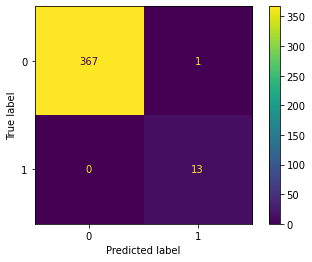

In [46]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(n_gene_model, X_test, y_test)
plt.show()

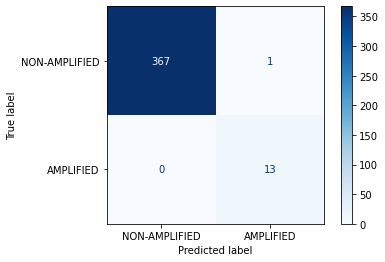

In [47]:
class_names = ["NON-AMPLIFIED", "AMPLIFIED"]
plot_confusion_matrix(n_gene_model, X_test, y_test, 
                      display_labels=class_names, 
                      cmap=plt.cm.Blues)
plt.show()

In [48]:
print(f"Balanced accuracy score: {balanced_accuracy_score(y_test, y_preds)}")

Balanced accuracy score: 0.9986413043478262


In [62]:
for index, prediction, label in zip(X_test.index, y_preds, y_test):
    if (prediction != label):
        print(index, 'has been classified as ', prediction, 'and should be ', label)

119 has been classified as  1 and should be  0


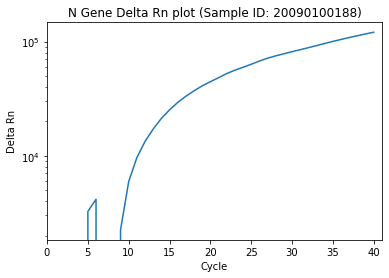

In [184]:
plot_x = [i for i in range(1, 41)]
plot_y = X_test.loc[119].to_list()
plt.plot(plot_x, plot_y)
plt.yscale("log")
plt.xlabel('Cycle')
plt.ylabel('Delta Rn')
plt.title('N Gene Delta Rn plot (Sample ID: 20090100188)')
plt.xlim(0, 41)
plt.show()

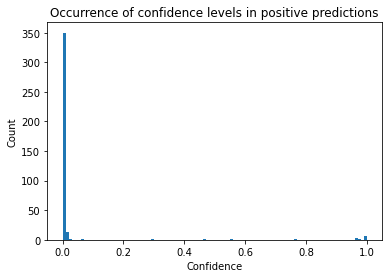

In [149]:
n_gene_conf = n_gene_model.predict_proba(X_test)
negative_y = []
positive_y = []
for i in range(0, 381):
    negative_y.append(n_gene_conf[i][0])
    positive_y.append(n_gene_conf[i][1])
plt.hist(positive_y, bins=100)
plt.xlabel("Confidence")
plt.ylabel("Count")
plt.title("Occurrence of confidence levels in positive predictions")
plt.show()

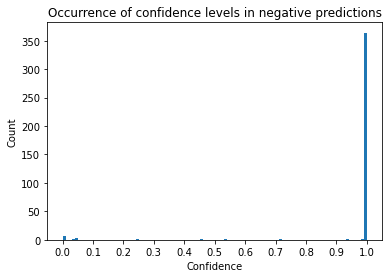

In [168]:
plt.hist(negative_y, bins=100)
plt.xticks([i * 0.10 for i in range(0, 11)])
plt.xlabel("Confidence")
plt.ylabel("Count")
plt.title("Occurrence of confidence levels in negative predictions")
plt.show()

In [175]:
print(f"Count of 1.0s: {negative_y.count(1.0)}")
print(f"Count of 0.0s: {negative_y.count(0.0)}")

Count of 1.0s: 350
Count of 0.0s: 7


In [3]:
def plot_single_gene_curve(delta_rn_values, gene, sample_id):
    plot_x = [i for i in range(1, 41)]
    plot_y = delta_rn_values
    plt.plot(plot_x, plot_y)
    plt.yscale('log')
    plt.xlabel('Cycle')
    plt.ylabel('Delta Rn')
    plt.title(f'{gene} Delta Rn plot (Sample ID: {sample_id})')
    plt.xlim(0, 41)
    plt.show()

def add_all_data_to_csv(excel_directory, txt_directory):
    gene_list = ['n_gene', 's_gene', 'ms2', 'orf1ab', 'rp_cy5']
    for excel_file in [f for f in listdir(excel_directory) if regex.match('\\d{6}-COV\\d{1,2}-[A-Z].xlsx', f)]:
        plate_name = excel_file.split('.')[0]
        txt_file = [f for f in listdir(txt_directory) if regex.match(f'{plate_name}_QuantStudio 12K Flex_export.txt', f)][0]
        n_gene, s_gene, ms2, orf1ab, rp_cy5 = get_gene_dfs(path.join(excel_directory, excel_file), path.join(txt_directory, txt_file))
        gene_df_list = [n_gene, s_gene, ms2, orf1ab, rp_cy5]
        for gene, gene_df in zip(gene_list, gene_df_list):
            add_to_csv(f"{gene}.csv", gene_df, plate_name)
        
        
def create_gene_model(gene_csv, gene):
    gene_model = RandomForestClassifier(n_estimators=100)
    undesirables = "['neg', 'PC', '', 0]"
    repeat = "['REPEAT']"
    X = gene_csv.query(f'sample_id != {undesirables}').query(f'{gene}_result != {repeat}') \
    .drop(["sample_id", "plate_id", "n_gene_result", "well_position", "well"], axis=1)
    y = gene_csv.query(f'sample_id != {undesirables}').query(f'{gene}_result != {repeat}')[f'{gene}_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
    gene_model.fit(X_train, y_train)
    return gene_model

In [80]:
def make_gene_csv(gene_df, gene, plate_id):
    gene_df['plate_id'] = plate_id
    gene_df.to_csv(f"{gene}.csv")

In [81]:
n_gene, s_gene, ms2, orf1ab, rp_cy5 = get_gene_dfs("090120-COV1-P.xlsx", "090120-COV1-P_QuantStudio 12K Flex_export.txt")
gene_list = [n_gene, s_gene, ms2, orf1ab, rp_cy5]
genes = ["n_gene", "s_gene", "ms2", "orf1ab", "rp_cy5"]
for gene_df, gene in zip(gene_list, genes):
    make_gene_csv(gene_df, gene, "090120-COV1-P")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [4]:
# redo imports
import pandas as pd
import numpy as np
from sklearn.metrics import precision_recall_fscore_support, matthews_corrcoef, f1_score, confusion_matrix, balanced_accuracy_score
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
import regex
from io import StringIO
from regex import match
import json
from pathlib import Path
from os import path, listdir, mkdir
import configargparse
import tensorflow as tf

In [6]:
# Checking that excel files have matching txt file
listdir()

['.ipynb_checkpoints',
 '090120-COV1-P.xlsx',
 '090120-COV1-P_QuantStudio 12K Flex_export.txt',
 '090120-COV3-B.xlsx',
 '090120-COV3-B_QuantStudio 12K Flex_export.txt',
 '091920-COV3-B.xlsx',
 '091920-COV3-B_QuantStudio 12K Flex_export.txt',
 'ms2.csv',
 'ms2_old.csv',
 'Nazgul N gene.ipynb',
 'Nazgul Transformation PIpeline.ipynb',
 'n_gene.csv',
 'n_gene_old.csv',
 'orf1ab.csv',
 'orf1ab_old.csv',
 'rp_cy5.csv',
 'rp_cy5_old.csv',
 's_gene.csv',
 's_gene_old.csv']

In [2]:
txt_directory = "C:/Users/rielst.amand/Documents/COVID Test Data/txt_directory"
excel_directory = "C:/Users/rielst.amand/Documents/COVID Test Data/excel_directory"

In [45]:
def check_plate_matches(excel_directory, txt_directory):
    # Check each Excel for a matching txt file
    for file in listdir(excel_directory):
        plate_name = file.split('.')[0]
        match_tracker = {"Non-matches": 0, "Matches": 0}
        for txt_file in listdir(txt_directory):
            txt_plate_name = txt_file.split('.')[0]
            if (plate_name in txt_plate_name):
                match_tracker["Matches"] += 1
            else:
                match_tracker["Non-matches"] += 1
        if (match_tracker["Matches"] != 1):
            print(f"The Excel file with the plate ID {plate_name} has {match_tracker['Matches']} txt matches")
    
    # Check each txt file for a matching Excel file
    for file in listdir(txt_directory):
        plate_name = file.split('.')[0]
        match_tracker = {"Non-matches": 0, "Matches": 0}
        for excel_file in listdir(excel_directory):
            excel_plate_name = excel_file.split('.')[0]
            if (excel_plate_name in plate_name):
                match_tracker["Matches"] += 1
            else:
                match_tracker["Non-matches"] += 1
        if (match_tracker["Matches"] != 1):
            print(f"The txt file with the plate ID {plate_name} has {match_tracker['Matches']} Excel matches")
    print("Completed Checking")

In [46]:
check_plate_matches(excel_directory, txt_directory)

Completed Checking


In [51]:
print(path.join(excel_directory, "090120-COV2-F.xlsx"))

C:/Users/rielst.amand/Documents/COVID Test Data/excel_directory\090120-COV2-F.xlsx


In [55]:
test = pd.read_excel(path.join(excel_directory, "090120-COV2-F.xlsx"), sheet_name="To Harvest")
test

,SAMPLE ID,TEST,RESULT
0,20082963141,COVID-19,NON-DETECTED
1,20082645531,COVID-19,NON-DETECTED
2,20082863101,COVID-19,NON-DETECTED
3,20082537682,COVID-19,NON-DETECTED
4,20082863100,COVID-19,NON-DETECTED
...,...,...,...
1147,20090100657,SARS2TP,NOT DETECTED
1148,neg,SARS2TP,NaN
1149,neg,SARS2TP,NOT DETECTED
1150,neg,SARS2TP,NaN


In [71]:
def test_add_all_data_to_csv(excel_directory, txt_directory):
    gene_list = ['n_gene', 's_gene', 'ms2', 'orf1ab', 'rp_cy5']
    file_dict = {}
    for excel_file in [f for f in listdir(excel_directory) if regex.match('\\d{6}-COV\\d{1,2}-[A-Z].xlsx', f)]:
        plate_name = excel_file.split('.')[0]
        txt_file = [f for f in listdir(txt_directory) if regex.match(f'{plate_name}_QuantStudio 12K Flex_export.txt', f)][0]
        file_dict[f"{excel_file}"] = txt_file
        #n_gene, s_gene, ms2, orf1ab, rp_cy5 = get_gene_dfs(path.join(excel_directory, excel_file), path.join(txt_directory, txt_file))
        #gene_df_list = [n_gene, s_gene, ms2, orf1ab, rp_cy5]
        #for gene, gene_df in zip(gene_list, gene_df_list):
            #add_to_csv(f"{gene}.csv", gene_df, plate_name)
    print(file_dict)

In [72]:
test_add_all_data_to_csv(excel_directory, txt_directory)

{'090120-COV10-F.xlsx': '090120-COV10-F_QuantStudio 12K Flex_export.txt', '090120-COV12-M.xlsx': '090120-COV12-M_QuantStudio 12K Flex_export.txt', '090120-COV13-F.xlsx': '090120-COV13-F_QuantStudio 12K Flex_export.txt', '090120-COV14-B.xlsx': '090120-COV14-B_QuantStudio 12K Flex_export.txt', '090120-COV15-M.xlsx': '090120-COV15-M_QuantStudio 12K Flex_export.txt', '090120-COV16-P.xlsx': '090120-COV16-P_QuantStudio 12K Flex_export.txt', '090120-COV17-F.xlsx': '090120-COV17-F_QuantStudio 12K Flex_export.txt', '090120-COV18-B.xlsx': '090120-COV18-B_QuantStudio 12K Flex_export.txt', '090120-COV19-M.xlsx': '090120-COV19-M_QuantStudio 12K Flex_export.txt', '090120-COV2-F.xlsx': '090120-COV2-F_QuantStudio 12K Flex_export.txt', '090120-COV20-P.xlsx': '090120-COV20-P_QuantStudio 12K Flex_export.txt', '090120-COV21-F.xlsx': '090120-COV21-F_QuantStudio 12K Flex_export.txt', '090120-COV3-B.xlsx': '090120-COV3-B_QuantStudio 12K Flex_export.txt', '090120-COV4-M.xlsx': '090120-COV4-M_QuantStudio 12K F

In [73]:
n_gene, s_gene, ms2, orf1ab, rp_cy5 = get_gene_dfs(path.join(excel_directory, "090120-COV2-F.xlsx"), path.join(txt_directory, "090120-COV10-F_QuantStudio 12K Flex_export.txt"))
n_gene

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,n_gene_delta_cycle1,n_gene_delta_cycle2,n_gene_delta_cycle3,n_gene_delta_cycle4,n_gene_delta_cycle5,n_gene_delta_cycle6,n_gene_delta_cycle7,n_gene_delta_cycle8,n_gene_delta_cycle9,n_gene_delta_cycle10,...,n_gene_delta_cycle34,n_gene_delta_cycle35,n_gene_delta_cycle36,n_gene_delta_cycle37,n_gene_delta_cycle38,n_gene_delta_cycle39,n_gene_delta_cycle40,sample_id,n_gene_result,well_position
well,,,,,,,,,,,,,,,,,,,,,
1,-1361.717,-1216.609,-1258.563,-1074.939,-628.924,-401.284,-173.543,26.722,334.197,611.337,...,5069.956,5513.682,6157.829,6965.008,7781.413,8518.850,8980.661,20082963141,NON-AMPLIFIED,A1
2,-3009.937,-2725.644,-2567.381,-2048.314,-1633.747,-1434.632,-1197.768,-542.279,372.468,1130.839,...,3292.468,3801.223,4385.806,5100.787,5589.604,6218.234,7103.833,20082645531,NON-AMPLIFIED,A2
3,-817.702,-733.465,-824.493,-783.147,-536.300,-126.492,44.378,170.670,672.298,852.840,...,374.589,703.475,1288.486,1766.661,1839.343,2245.901,3306.513,20082863101,NON-AMPLIFIED,A3
4,-233.105,-323.094,-464.146,-295.807,-55.108,213.801,404.062,572.604,599.380,715.384,...,184.934,785.679,1414.713,1610.919,1828.462,2275.722,2818.655,20082537682,NON-AMPLIFIED,A4
5,-983.573,-886.847,-963.230,-909.082,-657.645,-124.224,281.315,365.510,382.790,588.657,...,439.490,727.669,1136.583,1541.582,1659.277,1834.284,2146.221,20082863100,NON-AMPLIFIED,A5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,1888.415,1537.646,650.534,-561.282,-613.285,400.150,373.819,-256.606,-328.468,335.138,...,737740.250,745324.750,751601.750,757210.062,761421.062,766418.312,772794.000,20090100657,NON-AMPLIFIED,P20
381,-402.745,-160.240,-21.906,391.177,1534.761,18.313,-318.448,223.651,226.079,288.287,...,867.680,538.388,939.987,2198.540,2701.811,2410.472,2587.728,neg4,NON-AMPLIFIED,P21
382,-701.237,-536.924,-85.032,207.094,454.299,470.425,619.098,1160.896,1566.757,1683.508,...,3046.723,3490.256,4139.960,4910.274,5284.306,5799.229,6327.887,neg5,NON-AMPLIFIED,P22


In [27]:
add_all_data_to_csv(excel_directory, txt_directory)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [33]:
completed_txt = listdir("C:/Users/rielst.amand/Documents/COVID Test Data/completed_txt")
buggy_txt = listdir("C:/Users/rielst.amand/Documents/COVID Test Data/buggy_txt")

In [37]:
print(len(buggy_txt)/(len(buggy_txt) + len(completed_txt)))

0.04330708661417323


In [284]:
# 4.33% of original plate file pairs had to be excluded due to errors during aggregation
n_gene = pd.read_csv("n_gene.csv")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [41]:
n_gene.describe()

,well,n_gene_delta_cycle1,n_gene_delta_cycle2,n_gene_delta_cycle3,n_gene_delta_cycle4,n_gene_delta_cycle5,n_gene_delta_cycle6,n_gene_delta_cycle7,n_gene_delta_cycle8,n_gene_delta_cycle9,...,n_gene_delta_cycle31,n_gene_delta_cycle32,n_gene_delta_cycle33,n_gene_delta_cycle34,n_gene_delta_cycle35,n_gene_delta_cycle36,n_gene_delta_cycle37,n_gene_delta_cycle38,n_gene_delta_cycle39,n_gene_delta_cycle40
count,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,...,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000,185856.000000
mean,192.500000,-1547.746711,-1384.895618,-1226.682367,-914.001850,-550.387285,-172.484457,204.613500,565.688828,884.202371,...,12478.543319,13964.306740,15444.112424,16901.338000,18303.215928,19626.832519,20850.595793,21963.053930,22979.083809,23857.876931
std,110.851174,3137.092072,2705.428718,2031.354690,1593.709286,1316.018153,1160.283975,1126.615561,1192.623612,1329.736147,...,71846.314466,75701.412464,79235.376772,82474.809832,85419.717809,88052.116922,90338.011107,92275.665178,93932.303268,95185.313030
min,1.000000,-126730.719000,-95648.617000,-68215.883000,-48667.520000,-36135.746000,-48982.414000,-57305.492000,-40275.281000,-41787.645000,...,-289944.719000,-301396.969000,-312451.125000,-323625.281000,-334872.031000,-346055.875000,-357441.031000,-368769.125000,-379664.250000,-390765.719000
25%,96.750000,-3487.994750,-3043.249750,-2501.903250,-1865.209250,-1268.947000,-764.742000,-368.078000,-86.777000,117.107500,...,-959.874250,-590.829250,-233.624000,120.092000,459.000750,791.528000,1127.703500,1468.582750,1798.589500,2115.010500
50%,192.500000,-1208.121000,-1075.386500,-948.819000,-728.253500,-466.083500,-196.704500,29.664500,293.790000,603.923000,...,268.674500,614.635500,1040.252500,1539.432500,2058.986000,2595.071000,3151.605000,3710.008000,4275.197500,4827.202000
75%,288.250000,220.638500,116.953000,0.000000,-22.726250,61.525750,260.636250,595.466250,1033.233750,1485.991750,...,3606.610250,4282.472500,4965.387750,5664.756250,6372.793750,7096.022750,7809.363500,8515.219250,9211.563500,9896.534750
max,384.000000,79050.312000,73275.773000,97814.219000,100702.914000,105121.727000,102508.133000,79739.578000,66686.047000,80634.180000,...,852173.500000,863832.938000,876548.375000,888545.938000,897870.688000,909169.188000,916612.625000,926216.188000,937472.062000,945667.625000


In [45]:
1 - (174661/185856)

0.06023480544077131

In [285]:
# 6.02% of remaining data is excluded due to NA values in answers or sample_id section
n_gene = n_gene.dropna()
#n_gene.info()

In [336]:
# Create n_gene model
#n_gene_model = RandomForestClassifier(n_estimators=100)
undesirables = "['neg', 'PC', '', 0, 'unknown']"
binary = "['AMPLIFIED', 'NON-AMPLIFIED']"
X = n_gene.query(f'sample_id != {undesirables}').query(f'n_gene_result == {binary}') \
    .drop(["sample_id", "plate_id", "n_gene_result", "well_position", "well", "n_gene_delta_cycle1", "n_gene_delta_cycle2", 
           "n_gene_delta_cycle3", "n_gene_delta_cycle4", "n_gene_delta_cycle5", "n_gene_delta_cycle6", 
           "n_gene_delta_cycle7", "n_gene_delta_cycle8", "n_gene_delta_cycle9", "n_gene_delta_cycle10"], axis=1)
y = n_gene.query(f'sample_id != {undesirables}').query(f'n_gene_result == {binary}')[f'n_gene_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)
#n_gene_model.fit(X_train, y_train)

In [53]:
n_gene_model.score(X_test, y_test)

0.9990470613899126

In [55]:
n_gene_scores = cross_val_score(n_gene_model, X, y, cv=5)
print(f"Cross val score: {n_gene_scores.mean()}")

Cross val score: 0.9987715203895604


In [57]:
from sklearn.metrics import plot_confusion_matrix

Precision recall fscore support: (array([0.99955799, 0.98643468]), array([0.99945053, 0.98905973]), array([0.99950426, 0.98774546]), array([83717,  3382], dtype=int64))
Matthews Correlation Coefficient: 0.9872506600146821
F1 score: 0.9877454599143659
Balanced Accuracy Score: 0.9942551288662975


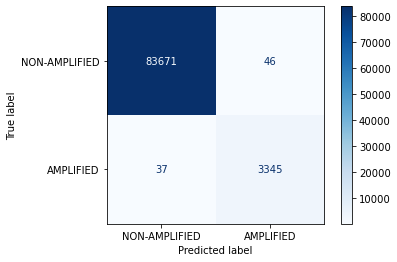

In [58]:
# Metrics for a model
y_preds = n_gene_model.predict(X_test)
print(f"Precision recall fscore support: {precision_recall_fscore_support(y_test, y_preds)}")
print(f"Matthews Correlation Coefficient: {matthews_corrcoef(y_test, y_preds)}")
print(f"F1 score: {f1_score(y_test, y_preds)}")
print(f"Balanced Accuracy Score: {balanced_accuracy_score(y_test, y_preds)}")
class_names = ["NON-AMPLIFIED", "AMPLIFIED"]
plot_confusion_matrix(n_gene_model, X_test, y_test, 
                      display_labels=class_names, 
                      cmap=plt.cm.Blues)
plt.show()
#n_gene_conf = n_gene_model.predict_proba(X_test)

In [60]:
n_gene_conf = n_gene_model.predict_proba(X_test)
negative_y = []
positive_y = []
for i in range(0, len(n_gene_conf)):
    negative_y.append(n_gene_conf[i][0])
    positive_y.append(n_gene_conf[i][1])
print(f"Count of positive 1.0s: {positive_y.count(1.0)}")
print(f"Count of negative 1.0s: {negative_y.count(1.0)}")

Count of positive 1.0s: 2432
Count of negative 1.0s: 82310


In [62]:
print(f"Rate of 100% confidence: {(positive_y.count(1.0) + negative_y.count(1.0))/len(y_test)}")

Rate of 100% confidence: 0.9729388397111333


In [1]:
import tensorflow as tf

In [337]:
X_train_shape = X_train.values.reshape(87099, 1, 30)
y_train_shape = y_train.values.reshape(87099, 1)
X_test_shape = X_test.values.reshape(87099, 1, 30)
y_test_shape= y_test.values.reshape(87099, 1)

In [432]:
y_test_shape.sum()

3382

In [288]:
class_weights = {0: 1, 1: 25}

In [338]:
dataset = tf.data.Dataset.from_tensor_slices((X_train_shape, y_train_shape))
train_dataset = dataset.shuffle(len(X_train_shape)).batch(1)
dataset2 = tf.data.Dataset.from_tensor_slices((X_test_shape, y_test_shape))
test_dataset = dataset2.shuffle(len(X_test_shape)).batch(1)

def get_compiled_model():
    model = tf.keras.Sequential([
        tf.keras.layers.Conv1D(40, 1, activation='tanh', input_shape=(1, 40)),
        tf.keras.layers.MaxPooling1D(pool_size=1),
        tf.keras.layers.LSTM(40, activation='tanh'),
        tf.keras.layers.Dense(40, activation='tanh'),
        tf.keras.layers.Dense(1, activation='sigmoid')
      ])

    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

n_gene_tf_model = get_new_model()
n_gene_tf_model.fit(X_train_shape, y_train_shape, epochs=200, shuffle=True, class_weight=class_weights, batch_size=1000)

  ...
    to  
  ['...']
Train on 87099 samples
Epoch 1/200
87099/87099 [==============================] - 26s 295us/sample - loss: 0.8097 - accuracy: 0.7047
Epoch 2/200
87099/87099 [==============================] - 2s 27us/sample - loss: 0.3193 - accuracy: 0.9026
Epoch 3/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.1135 - accuracy: 0.9789
Epoch 4/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0919 - accuracy: 0.9848
Epoch 5/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0845 - accuracy: 0.9871
Epoch 6/200
87099/87099 [==============================] - 2s 29us/sample - loss: 0.0793 - accuracy: 0.9883
Epoch 7/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0752 - accuracy: 0.9892
Epoch 8/200
87099/87099 [==============================] - 2s 25us/sample - loss: 0.0716 - accuracy: 0.9900
Epoch 9/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.07

87099/87099 [==============================] - 2s 28us/sample - loss: 0.0161 - accuracy: 0.9971
Epoch 75/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0177 - accuracy: 0.9970
Epoch 76/200
87099/87099 [==============================] - 2s 25us/sample - loss: 0.0172 - accuracy: 0.9969
Epoch 77/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0169 - accuracy: 0.9970
Epoch 78/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0160 - accuracy: 0.9971
Epoch 79/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0170 - accuracy: 0.9968
Epoch 80/200
87099/87099 [==============================] - 2s 27us/sample - loss: 0.0157 - accuracy: 0.9973
Epoch 81/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0183 - accuracy: 0.9969
Epoch 82/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0148 - accuracy: 0.9971
Epoch 83/200
87099/87099 [======

87099/87099 [==============================] - 2s 27us/sample - loss: 0.0106 - accuracy: 0.9978
Epoch 148/200
87099/87099 [==============================] - 2s 27us/sample - loss: 0.0106 - accuracy: 0.9979
Epoch 149/200
87099/87099 [==============================] - 2s 26us/sample - loss: 0.0107 - accuracy: 0.9978
Epoch 150/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0106 - accuracy: 0.9979
Epoch 151/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0108 - accuracy: 0.9978
Epoch 152/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0104 - accuracy: 0.9978
Epoch 153/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0108 - accuracy: 0.9978
Epoch 154/200
87099/87099 [==============================] - 2s 28us/sample - loss: 0.0114 - accuracy: 0.9978
Epoch 155/200
87099/87099 [==============================] - 2s 27us/sample - loss: 0.0106 - accuracy: 0.9979
Epoch 156/200
87099/8709

In [ ]:
print("RandomForest test accuracy: 0.999; cross accuracy: 0.998; balanced accuracy: 0.994")
print("First NN model max accuracy: 0.9957; min loss: 9.8; optimizer: rmsprop")
print("Second NN model max accuracy: 0.9605; min loss: 0.1686; optimizer: adam")
print("Third NN model max accuracy: 0.9745; min loss: 0.1334; optimizer: rmsprop")
print("Fourth NN model max accuracy: 0.9827; min loss: 0.0639; optimizer: rmsprop")
print("Fifth NN model max accuracy: 0.9887; min loss: 0.0752; optimizer: rmsprop")
print("Sixth NN model max accuracy: 0.9901; min loss: 0.0702; optimizer: rmsprop")
print("Seventh NN model max accuracy: 0.9901; min loss: 0.0731; optimizer: rmsprop")
print("Sixth NN model with dropout max accuracy: 0.9812; min loss: 0.0936; optimizer: rmsprop")
print("Sixth NN model with Adam max accuracy: 0.9907; min loss: 0.0301; optimizer: adam")
print("Sixth NN model with Adam but 50 epcohs max accuracy: 0.9912; min loss: 0.0282; optimizer: adam")

In [126]:
scores = n_gene_tf_model.evaluate(X_test_shape, y_test_shape, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))
print(scores)

Accuracy: 99.27%
[0.023336348022513817, 0.9927324]


In [342]:
# Save n_gene network
n_gene_tf_model.save("n_gene_model.h5")

In [128]:
def get_compiled_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Conv1D(40, 1, activation='tanh', input_shape=(1, 40)),
        tf.keras.layers.MaxPooling1D(pool_size=1),
        tf.keras.layers.LSTM(40, activation='tanh'),
        tf.keras.layers.Dense(40, activation='tanh'),
        tf.keras.layers.Dense(1, activation='sigmoid')
      ])

    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

n_gene_tf2_model = get_compiled_model2()
n_gene_tf2_model.fit(train_dataset, epochs=50, shuffle=True)

Train for 87099 steps
Epoch 1/50
87099/87099 [==============================] - 219s 3ms/step - loss: 0.0632 - accuracy: 0.9747
Epoch 2/50
87099/87099 [==============================] - 241s 3ms/step - loss: 0.0480 - accuracy: 0.9815
Epoch 3/50
87099/87099 [==============================] - 245s 3ms/step - loss: 0.0380 - accuracy: 0.9863
Epoch 4/50
87099/87099 [==============================] - 248s 3ms/step - loss: 0.0501 - accuracy: 0.9817
Epoch 5/50
87099/87099 [==============================] - 261s 3ms/step - loss: 0.0526 - accuracy: 0.9821
Epoch 6/50
87099/87099 [==============================] - 264s 3ms/step - loss: 0.0355 - accuracy: 0.9875
Epoch 7/50
87099/87099 [==============================] - 276s 3ms/step - loss: 0.0343 - accuracy: 0.9881
Epoch 8/50
87099/87099 [==============================] - 282s 3ms/step - loss: 0.0334 - accuracy: 0.9884
Epoch 9/50
87099/87099 [==============================] - 272s 3ms/step - loss: 0.0368 - accuracy: 0.9874
Epoch 10/50
87099/87099 

In [129]:
scores = n_gene_tf2_model.evaluate(X_test_shape, y_test_shape, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))
print(f"Loss: {scores[0]}")

Accuracy: 98.77%
Loss: 0.03375039036725165


In [130]:
def get_model_metrics(gene_model, X_test, y_test):
    y_preds = gene_model.predict(X_test)
    print(f"Precision recall fscore support: {precision_recall_fscore_support(y_test, y_preds)}")
    print(f"Matthews Correlation Coefficient: {matthews_corrcoef(y_test, y_preds)}")
    print(f"F1 score: {f1_score(y_test, y_preds)}")
    print(f"Balanced Accuracy Score: {balanced_accuracy_score(y_test, y_preds)}")
    class_names = ["NON-AMPLIFIED", "AMPLIFIED"]
    plot_confusion_matrix(gene_model, X_test, y_test, 
                      display_labels=class_names, 
                      cmap=plt.cm.Blues)
    plt.show()
    gene_conf = gene_model.predict_proba(X_test)
    negative_y = []
    positive_y = []
    for i in range(0, len(gene_conf)):
        negative_y.append(gene_conf[i][0])
        positive_y.append(gene_conf[i][1])
    print(f"Count of positive 1.0s: {positive_y.count(1.0)}")
    print(f"Count of negative 1.0s: {negative_y.count(1.0)}")

In [328]:
# Get s_gene data
s_gene = pd.read_csv("s_gene.csv")
s_gene = s_gene.dropna()
undesirables = "['neg', 'PC', '', 0, 'unknown']"
binary = "['AMPLIFIED', 'NON-AMPLIFIED']"
X = s_gene.query(f'sample_id != {undesirables}').query(f's_gene_result == {binary}') \
    .drop(["sample_id", "plate_id", "s_gene_result", "well_position", "well", "s_gene_delta_cycle1", "s_gene_delta_cycle2", 
           "s_gene_delta_cycle3", "s_gene_delta_cycle4", "s_gene_delta_cycle5", "s_gene_delta_cycle6", 
           "s_gene_delta_cycle7", "s_gene_delta_cycle8", "s_gene_delta_cycle9", "s_gene_delta_cycle10"], axis=1)
y = s_gene.query(f'sample_id != {undesirables}').query(f's_gene_result == {binary}')[f's_gene_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [329]:
# Prepare s_gene datasets
X_train_shape = X_train.values.reshape(87224, 1, 30)
y_train_shape = y_train.values.reshape(87224, 1)
X_test_shape = X_test.values.reshape(87224, 1, 30)
y_test_shape= y_test.values.reshape(87224, 1)
dataset = tf.data.Dataset.from_tensor_slices((X_train_shape, y_train_shape))
train_dataset = dataset.shuffle(len(X_train_shape)).batch(1)
dataset2 = tf.data.Dataset.from_tensor_slices((X_test_shape, y_test_shape))
test_dataset = dataset2.shuffle(len(X_test_shape)).batch(1)

In [330]:
class_weights = {0: 1, 1: 26}

In [331]:
# Create s_gene model
s_gene_tf_model = get_new_model()
s_gene_tf_model.fit(X_train_shape, y_train_shape, epochs=200, shuffle=True, class_weight=class_weights, batch_size=1000)

  ...
    to  
  ['...']
Train on 87224 samples
Epoch 1/200
87224/87224 [==============================] - 8s 96us/sample - loss: 0.9599 - accuracy: 0.6698
Epoch 2/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.4904 - accuracy: 0.8545
Epoch 3/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.1781 - accuracy: 0.9650
Epoch 4/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.1483 - accuracy: 0.9726
Epoch 5/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.1380 - accuracy: 0.9738
Epoch 6/200
87224/87224 [==============================] - 2s 28us/sample - loss: 0.1264 - accuracy: 0.9772
Epoch 7/200
87224/87224 [==============================] - 3s 30us/sample - loss: 0.1207 - accuracy: 0.9787
Epoch 8/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.1136 - accuracy: 0.9793
Epoch 9/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.1084

87224/87224 [==============================] - 2s 26us/sample - loss: 0.0392 - accuracy: 0.9933
Epoch 75/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0411 - accuracy: 0.9930
Epoch 76/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0401 - accuracy: 0.9930s - loss: 0.0407 - accuracy
Epoch 77/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0407 - accuracy: 0.9933
Epoch 78/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0406 - accuracy: 0.9929
Epoch 79/200
87224/87224 [==============================] - 2s 28us/sample - loss: 0.0402 - accuracy: 0.9930
Epoch 80/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.0416 - accuracy: 0.9926
Epoch 81/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0383 - accuracy: 0.9934s - loss: 0.0
Epoch 82/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0382 - accuracy:

87224/87224 [==============================] - 2s 27us/sample - loss: 0.0277 - accuracy: 0.9947
Epoch 147/200
87224/87224 [==============================] - 2s 28us/sample - loss: 0.0303 - accuracy: 0.9940
Epoch 148/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.0274 - accuracy: 0.9950s - loss:
Epoch 149/200
87224/87224 [==============================] - 2s 24us/sample - loss: 0.0273 - accuracy: 0.9948
Epoch 150/200
87224/87224 [==============================] - 2s 25us/sample - loss: 0.0264 - accuracy: 0.9950
Epoch 151/200
87224/87224 [==============================] - 2s 27us/sample - loss: 0.0273 - accuracy: 0.9947
Epoch 152/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.0270 - accuracy: 0.9950
Epoch 153/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.0287 - accuracy: 0.9945s - los
Epoch 154/200
87224/87224 [==============================] - 2s 26us/sample - loss: 0.0260 - accuracy: 0.9951
Epoch 15

In [422]:
y_test_shape.sum()

3262

In [182]:
print("Accuracy: %.2f%%" % (s_scores[1]*100))
print(f"Loss: {s_scores[0]}")

Accuracy: 98.92%
Loss: 0.03129951239404197


In [335]:
# Save s gene model
s_gene_tf_model.save("s_gene_model.h5")

In [272]:
# Get ms2 gene data
ms2 = pd.read_csv("ms2.csv")
ms2 = ms2.dropna()
undesirables = "['neg', 'PC', '', 0, 'unknown']"
binary = "['AMPLIFIED', 'NON-AMPLIFIED']"
X = ms2.query(f'sample_id != {undesirables}').query(f'ms2_result == {binary}') \
    .drop(["sample_id", "plate_id", "ms2_result", "well_position", "well", 
           "ms2_delta_cycle1", "ms2_delta_cycle2", "ms2_delta_cycle3", "ms2_delta_cycle4", "ms2_delta_cycle5", 
           "ms2_delta_cycle6", "ms2_delta_cycle7", "ms2_delta_cycle8", "ms2_delta_cycle9", "ms2_delta_cycle10"], axis=1)
y = ms2.query(f'sample_id != {undesirables}').query(f'ms2_result == {binary}')[f'ms2_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [179]:
ms2_rf_model = RandomForestClassifier()
ms2_rf_model.fit(X_train, y_train)
ms2_rf_model.score(X_test, y_test)

0.914472854078484

In [273]:
# Prepare ms2 datasets
X_train_shape = X_train.values.reshape(87176, 1, 30)
y_train_shape = y_train.values.reshape(87176, 1)
X_test_shape = X_test.values.reshape(87177, 1, 30)
y_test_shape= y_test.values.reshape(87177, 1)
dataset = tf.data.Dataset.from_tensor_slices((X_train_shape, y_train_shape))
train_dataset = dataset.shuffle(len(X_train_shape)).batch(1)
dataset2 = tf.data.Dataset.from_tensor_slices((X_test_shape, y_test_shape))
test_dataset = dataset2.shuffle(len(X_test_shape)).batch(1)

In [311]:
y_test_shape.sum()

76220

In [274]:
class_weights = {0: 7, 1: 1}

In [283]:
def get_new_model():
    model = tf.keras.Sequential([
        tf.keras.layers.LayerNormalization(input_shape=(1, 30)),
        tf.keras.layers.Conv1D(30, 1, activation='tanh', input_shape=(1, 30)),
        tf.keras.layers.MaxPooling1D(pool_size=1),
        tf.keras.layers.LSTM(30, activation='tanh'),
        tf.keras.layers.Dense(30, activation='tanh'),
        tf.keras.layers.Dense(1, activation='sigmoid')
      ])

    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model


In [275]:
# Create ms2 model
ms2_model = get_new_model()
ms2_model.fit(X_train_shape, y_train_shape, epochs=1000, shuffle=True, class_weight=class_weights, batch_size=1000)

  ...
    to  
  ['...']
Train on 87176 samples
Epoch 1/1000
87176/87176 [==============================] - 2s 25us/sample - loss: 1.1277 - accuracy: 0.7943
Epoch 2/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 1.0444 - accuracy: 0.7824
Epoch 3/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 1.0116 - accuracy: 0.7933
Epoch 4/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.9858 - accuracy: 0.7723
Epoch 5/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.9707 - accuracy: 0.7754
Epoch 6/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.9612 - accuracy: 0.7706
Epoch 7/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.9555 - accuracy: 0.7657
Epoch 8/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.9444 - accuracy: 0.7708
Epoch 9/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.940

87176/87176 [==============================] - 1s 8us/sample - loss: 0.8401 - accuracy: 0.7991
Epoch 76/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8360 - accuracy: 0.8033
Epoch 77/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8375 - accuracy: 0.7990
Epoch 78/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8376 - accuracy: 0.8005
Epoch 79/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8324 - accuracy: 0.8035
Epoch 80/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8337 - accuracy: 0.8049
Epoch 81/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8328 - accuracy: 0.8034
Epoch 82/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8315 - accuracy: 0.8030
Epoch 83/1000
87176/87176 [==============================] - 1s 7us/sample - loss: 0.8320 - accuracy: 0.8045
Epoch 84/1000
87176/87176 [======

87176/87176 [==============================] - 1s 9us/sample - loss: 0.7967 - accuracy: 0.8105
Epoch 150/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7984 - accuracy: 0.8120
Epoch 151/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7946 - accuracy: 0.8120
Epoch 152/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7946 - accuracy: 0.8115
Epoch 153/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7932 - accuracy: 0.8108
Epoch 154/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7944 - accuracy: 0.8102
Epoch 155/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7942 - accuracy: 0.8122
Epoch 156/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7949 - accuracy: 0.8095
Epoch 157/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7910 - accuracy: 0.8121
Epoch 158/1000
87176/8717

87176/87176 [==============================] - 1s 9us/sample - loss: 0.7721 - accuracy: 0.8091
Epoch 224/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7662 - accuracy: 0.8120
Epoch 225/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7693 - accuracy: 0.8094
Epoch 226/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7685 - accuracy: 0.8110
Epoch 227/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7685 - accuracy: 0.8110
Epoch 228/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7706 - accuracy: 0.8108
Epoch 229/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7688 - accuracy: 0.8104
Epoch 230/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7686 - accuracy: 0.8116
Epoch 231/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7662 - accuracy: 0.8120
Epoch 232/1000
87176/8717

87176/87176 [==============================] - 1s 9us/sample - loss: 0.7476 - accuracy: 0.8132
Epoch 298/1000
87176/87176 [==============================] - 1s 10us/sample - loss: 0.7498 - accuracy: 0.8132
Epoch 299/1000
87176/87176 [==============================] - 1s 10us/sample - loss: 0.7497 - accuracy: 0.8114
Epoch 300/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7487 - accuracy: 0.8113
Epoch 301/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7513 - accuracy: 0.8106
Epoch 302/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7499 - accuracy: 0.8115
Epoch 303/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7529 - accuracy: 0.8113
Epoch 304/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7480 - accuracy: 0.8119
Epoch 305/1000
87176/87176 [==============================] - 1s 10us/sample - loss: 0.7492 - accuracy: 0.8131
Epoch 306/1000
87176/8

87176/87176 [==============================] - 1s 9us/sample - loss: 0.7325 - accuracy: 0.8140
Epoch 372/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7388 - accuracy: 0.8135
Epoch 373/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7341 - accuracy: 0.8137
Epoch 374/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7339 - accuracy: 0.8145
Epoch 375/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7312 - accuracy: 0.8149
Epoch 376/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7324 - accuracy: 0.8154
Epoch 377/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7343 - accuracy: 0.8146
Epoch 378/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7324 - accuracy: 0.8157
Epoch 379/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7329 - accuracy: 0.8132
Epoch 380/1000
87176/8717

87176/87176 [==============================] - 1s 8us/sample - loss: 0.7183 - accuracy: 0.8182
Epoch 446/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7213 - accuracy: 0.8164
Epoch 447/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7176 - accuracy: 0.8184
Epoch 448/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7176 - accuracy: 0.8188
Epoch 449/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7206 - accuracy: 0.8161
Epoch 450/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7178 - accuracy: 0.8176
Epoch 451/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7182 - accuracy: 0.8176
Epoch 452/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7164 - accuracy: 0.8181
Epoch 453/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7169 - accuracy: 0.8176
Epoch 454/1000
87176/8717

87176/87176 [==============================] - 1s 8us/sample - loss: 0.7086 - accuracy: 0.8186
Epoch 520/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7081 - accuracy: 0.8187
Epoch 521/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7043 - accuracy: 0.8195
Epoch 522/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7059 - accuracy: 0.8196
Epoch 523/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7069 - accuracy: 0.8210
Epoch 524/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7056 - accuracy: 0.8209
Epoch 525/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7040 - accuracy: 0.8201
Epoch 526/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.7033 - accuracy: 0.8203
Epoch 527/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.7031 - accuracy: 0.8213
Epoch 528/1000
87176/8717

87176/87176 [==============================] - 1s 10us/sample - loss: 0.6933 - accuracy: 0.8228
Epoch 594/1000
87176/87176 [==============================] - 1s 11us/sample - loss: 0.6930 - accuracy: 0.8229
Epoch 595/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6922 - accuracy: 0.8218
Epoch 596/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6943 - accuracy: 0.8222
Epoch 597/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6940 - accuracy: 0.8237
Epoch 598/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6935 - accuracy: 0.8226
Epoch 599/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6932 - accuracy: 0.8246
Epoch 600/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6919 - accuracy: 0.8231
Epoch 601/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6919 - accuracy: 0.8223
Epoch 602/1000
87176/87

87176/87176 [==============================] - 1s 9us/sample - loss: 0.6823 - accuracy: 0.8261
Epoch 668/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6847 - accuracy: 0.8236
Epoch 669/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6836 - accuracy: 0.8242
Epoch 670/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6836 - accuracy: 0.8242
Epoch 671/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6794 - accuracy: 0.8257
Epoch 672/1000
87176/87176 [==============================] - 1s 11us/sample - loss: 0.6825 - accuracy: 0.8244
Epoch 673/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6814 - accuracy: 0.8250
Epoch 674/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6804 - accuracy: 0.8265
Epoch 675/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6810 - accuracy: 0.8255
Epoch 676/1000
87176/871

87176/87176 [==============================] - 1s 9us/sample - loss: 0.6718 - accuracy: 0.8282
Epoch 742/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6711 - accuracy: 0.8273
Epoch 743/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6709 - accuracy: 0.8276
Epoch 744/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6711 - accuracy: 0.8290
Epoch 745/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6729 - accuracy: 0.8271
Epoch 746/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6712 - accuracy: 0.8265
Epoch 747/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6737 - accuracy: 0.8259
Epoch 748/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6715 - accuracy: 0.8265
Epoch 749/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6682 - accuracy: 0.82950s - loss: 0
Epoch 750/100

87176/87176 [==============================] - 1s 9us/sample - loss: 0.6581 - accuracy: 0.8310
Epoch 816/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6596 - accuracy: 0.8292
Epoch 817/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6572 - accuracy: 0.8329
Epoch 818/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6579 - accuracy: 0.8306
Epoch 819/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6594 - accuracy: 0.8304
Epoch 820/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6583 - accuracy: 0.8306
Epoch 821/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6568 - accuracy: 0.8313
Epoch 822/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6580 - accuracy: 0.8304
Epoch 823/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6567 - accuracy: 0.8312
Epoch 824/1000
87176/8717

87176/87176 [==============================] - 1s 9us/sample - loss: 0.6514 - accuracy: 0.8316
Epoch 890/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6486 - accuracy: 0.8325
Epoch 891/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6512 - accuracy: 0.8332
Epoch 892/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6509 - accuracy: 0.8306
Epoch 893/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6479 - accuracy: 0.8340
Epoch 894/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6518 - accuracy: 0.8321
Epoch 895/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6481 - accuracy: 0.8323
Epoch 896/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6486 - accuracy: 0.8323
Epoch 897/1000
87176/87176 [==============================] - 1s 8us/sample - loss: 0.6479 - accuracy: 0.8331
Epoch 898/1000
87176/8717

87176/87176 [==============================] - 1s 11us/sample - loss: 0.6405 - accuracy: 0.8340
Epoch 964/1000
87176/87176 [==============================] - 1s 11us/sample - loss: 0.6430 - accuracy: 0.8351
Epoch 965/1000
87176/87176 [==============================] - 1s 11us/sample - loss: 0.6372 - accuracy: 0.8353
Epoch 966/1000
87176/87176 [==============================] - 1s 11us/sample - loss: 0.6374 - accuracy: 0.8349
Epoch 967/1000
87176/87176 [==============================] - 1s 10us/sample - loss: 0.6402 - accuracy: 0.8349
Epoch 968/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6407 - accuracy: 0.8344
Epoch 969/1000
87176/87176 [==============================] - 1s 10us/sample - loss: 0.6398 - accuracy: 0.8330
Epoch 970/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6393 - accuracy: 0.8354
Epoch 971/1000
87176/87176 [==============================] - 1s 9us/sample - loss: 0.6386 - accuracy: 0.8350
Epoch 972/1000
8717

In [ ]:
ms2_scores = ms2_model.evaluate(test_dataset)
print("Accuracy: %.2f%%" % (ms2_scores[1]*100))
print(f"Loss: {ms2_scores[0]}")

In [183]:
print("Accuracy: %.2f%%" % (ms2_scores[1]*100))
print(f"Loss: {ms2_scores[0]}")

Accuracy: 88.56%
Loss: 0.34440911242534683


In [278]:
ms2_model.save("ms2_model.h5")

In [320]:
# Get orf1ab gene data
orf1ab = pd.read_csv("orf1ab.csv")
orf1ab = orf1ab.dropna()
undesirables = "['neg', 'PC', '', 0, 'unknown']"
binary = "['AMPLIFIED', 'NON-AMPLIFIED']"
X = orf1ab.query(f'sample_id != {undesirables}').query(f'orf1ab_result == {binary}') \
    .drop(["sample_id", "plate_id", "orf1ab_result", "well_position", "well", "orf1ab_delta_cycle1", "orf1ab_delta_cycle2", 
           "orf1ab_delta_cycle3", "orf1ab_delta_cycle4", "orf1ab_delta_cycle5", "orf1ab_delta_cycle6", 
           "orf1ab_delta_cycle7", "orf1ab_delta_cycle8", "orf1ab_delta_cycle9", "orf1ab_delta_cycle10"], axis=1)
y = orf1ab.query(f'sample_id != {undesirables}').query(f'orf1ab_result == {binary}')[f'orf1ab_result'] \
    .replace({"AMPLIFIED": 1, "NON-AMPLIFIED": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [188]:
X_test.shape

(87123, 40)

In [321]:
# Prepare orf1ab datasets
X_train_shape = X_train.values.reshape(87123, 1, 30)
y_train_shape = y_train.values.reshape(87123, 1)
X_test_shape = X_test.values.reshape(87123, 1, 30)
y_test_shape= y_test.values.reshape(87123, 1)
dataset = tf.data.Dataset.from_tensor_slices((X_train_shape, y_train_shape))
train_dataset = dataset.shuffle(len(X_train_shape)).batch(1)
dataset2 = tf.data.Dataset.from_tensor_slices((X_test_shape, y_test_shape))
test_dataset = dataset2.shuffle(len(X_test_shape)).batch(1)

In [296]:
y_train_shape.sum()

3334

In [322]:
class_weights = {0: 1, 1: 25}

In [323]:
orf1ab_model = get_new_model()
orf1ab_model.fit(X_train_shape, y_train_shape, epochs=200, shuffle=True, class_weight=class_weights, batch_size=1000)

  ...
    to  
  ['...']
Train on 87123 samples
Epoch 1/200
87123/87123 [==============================] - 8s 92us/sample - loss: 0.9807 - accuracy: 0.6656
Epoch 2/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.4858 - accuracy: 0.8647
Epoch 3/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.1997 - accuracy: 0.9586
Epoch 4/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.1637 - accuracy: 0.9670
Epoch 5/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.1491 - accuracy: 0.9712
Epoch 6/200
87123/87123 [==============================] - 2s 24us/sample - loss: 0.1404 - accuracy: 0.9727
Epoch 7/200
87123/87123 [==============================] - 2s 25us/sample - loss: 0.1302 - accuracy: 0.9757
Epoch 8/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.1236 - accuracy: 0.9773
Epoch 9/200
87123/87123 [==============================] - 2s 27us/sample - loss: 0.1167

87123/87123 [==============================] - 2s 25us/sample - loss: 0.0319 - accuracy: 0.9947
Epoch 74/200
87123/87123 [==============================] - 2s 27us/sample - loss: 0.0295 - accuracy: 0.9948
Epoch 75/200
87123/87123 [==============================] - 2s 27us/sample - loss: 0.0278 - accuracy: 0.9948
Epoch 76/200
87123/87123 [==============================] - 2s 27us/sample - loss: 0.0314 - accuracy: 0.9945
Epoch 77/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0324 - accuracy: 0.9944
Epoch 78/200
87123/87123 [==============================] - 2s 24us/sample - loss: 0.0275 - accuracy: 0.9952s -
Epoch 79/200
87123/87123 [==============================] - 2s 25us/sample - loss: 0.0289 - accuracy: 0.9948
Epoch 80/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0291 - accuracy: 0.9948s - los
Epoch 81/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0297 - accuracy: 0.9946
Epoch 82/200
87123/871

87123/87123 [==============================] - 2s 25us/sample - loss: 0.0177 - accuracy: 0.9967
Epoch 146/200
87123/87123 [==============================] - 2s 25us/sample - loss: 0.0177 - accuracy: 0.9966
Epoch 147/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0179 - accuracy: 0.9967
Epoch 148/200
87123/87123 [==============================] - 2s 25us/sample - loss: 0.0173 - accuracy: 0.9966
Epoch 149/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0171 - accuracy: 0.9968
Epoch 150/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0167 - accuracy: 0.9969
Epoch 151/200
87123/87123 [==============================] - 2s 23us/sample - loss: 0.0170 - accuracy: 0.9969
Epoch 152/200
87123/87123 [==============================] - 2s 26us/sample - loss: 0.0180 - accuracy: 0.9968
Epoch 153/200
87123/87123 [==============================] - 2s 25us/sample - loss: 0.0181 - accuracy: 0.9965
Epoch 154/200
87123/8712

In [303]:
orf1ab_scores = orf1ab_model.evaluate(test_dataset)
print("Accuracy: %.2f%%" % (orf1ab_scores[1]*100))
print(f"Loss: {orf1ab_scores[0]}")

43562/43562 [==============================] - 50s 1ms/step - loss: 0.1965 - accuracy: 0.9264
Accuracy: 92.64%
Loss: 0.19650118276753614


In [327]:
orf1ab_model.save("orf1ab_model.h5")

In [304]:
# Get rp_cy5 gene data
rp_cy5 = pd.read_csv("rp_cy5.csv")
rp_cy5 = rp_cy5.dropna()
undesirables = "['neg', 'PC', '', 0, 'unknown']"
binary = "['AMPLIFIED', 'REPEAT']"
X = rp_cy5.query(f'sample_id != {undesirables}').query(f'rp_cy5_result == {binary}') \
    .drop(["sample_id", "plate_id", "rp_cy5_result", "well_position", "well", "rp_cy5_delta_cycle1", "rp_cy5_delta_cycle2", 
           "rp_cy5_delta_cycle3", "rp_cy5_delta_cycle4", "rp_cy5_delta_cycle5", "rp_cy5_delta_cycle6", 
           "rp_cy5_delta_cycle7", "rp_cy5_delta_cycle8", "rp_cy5_delta_cycle9", "rp_cy5_delta_cycle10"], axis=1)
y = rp_cy5.query(f'sample_id != {undesirables}').query(f'rp_cy5_result == {binary}')[f'rp_cy5_result'] \
    .replace({"AMPLIFIED": 1, "REPEAT": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [402]:
X_train.shape

(86768, 30)

In [305]:
# Prepare rp_cy5 datasets
X_train_shape = X_train.values.reshape(86768, 1, 30)
y_train_shape = y_train.values.reshape(86768, 1)
X_test_shape = X_test.values.reshape(86768, 1, 30)
y_test_shape = y_test.values.reshape(86768, 1)

In [413]:
dataset = tf.data.Dataset.from_tensor_slices((X_train_shape, y_train_shape))
train_dataset = dataset.shuffle(len(X_train_shape)).batch(1)
dataset2 = tf.data.Dataset.from_tensor_slices((X_test_shape, y_test_shape))
test_dataset = dataset2.shuffle(len(X_test_shape)).batch(1)

In [306]:
class_weights = {0: 252, 1: 1}

In [310]:
rp_cy5_model = get_new_model()
rp_cy5_model.fit(X_train_shape, y_train_shape, epochs=100, shuffle=True, class_weight=class_weights, batch_size=1000)

  ...
    to  
  ['...']
Train on 86768 samples
Epoch 1/100
86768/86768 [==============================] - 2s 26us/sample - loss: 1.0668 - accuracy: 0.9295
Epoch 2/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.7184 - accuracy: 0.9085
Epoch 3/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.5704 - accuracy: 0.9167
Epoch 4/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.4885 - accuracy: 0.9268
Epoch 5/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.3823 - accuracy: 0.9556
Epoch 6/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.2912 - accuracy: 0.9675
Epoch 7/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.2462 - accuracy: 0.9746
Epoch 8/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.2137 - accuracy: 0.9742
Epoch 9/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1955 - accur

86768/86768 [==============================] - 1s 7us/sample - loss: 0.1190 - accuracy: 0.9875
Epoch 76/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1219 - accuracy: 0.9873
Epoch 77/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1158 - accuracy: 0.9864
Epoch 78/100
86768/86768 [==============================] - 1s 8us/sample - loss: 0.1251 - accuracy: 0.9867
Epoch 79/100
86768/86768 [==============================] - 1s 8us/sample - loss: 0.1214 - accuracy: 0.9867
Epoch 80/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1205 - accuracy: 0.9871
Epoch 81/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1176 - accuracy: 0.9872
Epoch 82/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1175 - accuracy: 0.9871
Epoch 83/100
86768/86768 [==============================] - 1s 7us/sample - loss: 0.1211 - accuracy: 0.9860
Epoch 84/100
86768/86768 [===============

In [277]:
rp_cy5_model.evaluate(test_dataset)

86768/86768 [==============================] - 88s 1ms/step - loss: 0.6274 - accuracy: 0.9389


[0.6274352150910989, 0.9388945]

In [311]:
y_preds = rp_cy5_model.predict_classes(X_test_shape)

In [312]:
balanced_accuracy_score(y_test_shape, y_preds)

0.974101341681348

In [313]:
rp_cy5_model.save("rp_cy5_model.h5")

In [339]:
n_gene_preds = n_gene_tf_model.predict_classes(X_test_shape)

In [340]:
balanced_accuracy_score(y_test_shape, n_gene_preds)

0.9955335976158081

In [332]:
s_gene_preds = s_gene_tf_model.predict_classes(X_test_shape)

In [333]:
balanced_accuracy_score(y_test_shape, s_gene_preds)

0.9940358263440859

In [276]:
ms2_gene_preds = ms2_model.predict_classes(X_test_shape)

In [277]:
balanced_accuracy_score(y_test_shape, ms2_gene_preds)

0.8042320057124619

In [324]:
orf1ab_preds = orf1ab_model.predict_classes(X_test_shape)

In [325]:
balanced_accuracy_score(y_test_shape, orf1ab_preds)

0.9939045249519809

In [140]:
X_graph = [i for i in range(11, 41)]
y_graph = X_train_shape[100][0]
y_graph_2 = X_train_shape[20][0]
y_graph_3 = X_train_shape[50][0]
y_graph_4 = X_train_shape[200][0]
y_graph_5 = X_train_shape[1000][0]

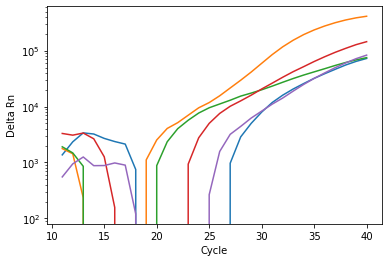

In [141]:
plt.plot(X_graph, y_graph)
plt.plot(X_graph, y_graph_2)
plt.plot(X_graph, y_graph_3)
plt.plot(X_graph, y_graph_4)
plt.plot(X_graph, y_graph_5)
plt.yscale("log")
plt.xlabel('Cycle')
plt.ylabel('Delta Rn')
plt.show()

In [142]:
print(f"Blue line result: {y_train_shape[100][0]}")
print(f"Orange line result: {y_train_shape[20][0]}")
print(f"Green line result: {y_train_shape[50][0]}")
print(f"Red line result: {y_train_shape[200][0]}")
print(f"Purple line result: {y_train_shape[1000][0]}")

Blue line result: 1
Orange line result: 1
Green line result: 1
Red line result: 1
Purple line result: 1


In [280]:
import tensorflowjs as tfjs

In [341]:
tfjs.converters.save_keras_model(n_gene_tf_model, "C:\\Users\\rielst.amand\\Documents\\n_gene")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\tensorflowjs\converters\keras_h5_conversion.py:123: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  return h5py.File(h5file)


In [334]:
tfjs.converters.save_keras_model(s_gene_tf_model, "C:\\Users\\rielst.amand\\Documents\\s_gene")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\tensorflowjs\converters\keras_h5_conversion.py:123: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  return h5py.File(h5file)


In [326]:
tfjs.converters.save_keras_model(orf1ab_model, "C:\\Users\\rielst.amand\\Documents\\orf1ab")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\tensorflowjs\converters\keras_h5_conversion.py:123: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  return h5py.File(h5file)


In [314]:
tfjs.converters.save_keras_model(rp_cy5_model, "C:\\Users\\rielst.amand\\Documents\\rp_cy5")

C:\Users\rielst.amand\Anaconda3\envs\tensorflow_env\lib\site-packages\tensorflowjs\converters\keras_h5_conversion.py:123: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  return h5py.File(h5file)
